# Introduction 

Author: Yuzhu Zhang (yuzhu.zhang@deliveryhero.com)

In [ ]:
# load packages
#from autoplotter import run_app # Importing the autoplotter for GUI Based EDA
from datetime import datetime, timedelta, time, date
from scipy import stats
import json
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.io import gbq
from google.cloud import bigquery
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import scipy.stats
#import geopandas
from shapely import wkt
import scipy
from scipy import signal
%matplotlib inline
from google.colab import drive # to allow colab save file in my drive
drive.mount('/content/drive')
from google.colab import auth
auth.authenticate_user()
print('Authenticated')
cwd=os.getcwd()
cwd
%unload_ext google.colab.data_table

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.activity.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fexperimentsandconfigs%20https%3a%2f%2fwww.googleapis.com%2fauth%2fphotos.native&response_type=code

Enter your authorization code:
4/1AY0e-g4D-iVaMYAnf-yseL87hK4ko13iksh12bZ-WOSvCcfvKGtSeKbZTdQ


In [ ]:
# define a few things (project id, start date etc.)
project_id = "fulfillment-dwh-production"
client = bigquery.Client(project = project_id)
entity_id = 'FP_SG'
country_code = 'sg'
start_date = '2020-10-21'
end_date = '2020-11-10'
pre_date = '2020-09-30'
time_zone = "Asia/Singapore" # to check delay data
zone_id = "1,2,3,4,5,6,7,9,27,28,30,34,35,36" # 3 = Far East, If you need two zones like zone 9 and zone 35, then put "9,35" behind "="
variant = "'Variation1','Variation2','Variation3', 'Original','Control'"

#define working directory
%cd "/content/drive/Shareddrives/Global Pricing/2 - Entities/APAC/Singapore/AB Tests/4. A B test MOV"
%pwd
%ls

/content/drive/Shareddrives/Global Pricing/2 - Entities/APAC/Singapore/AB Tests/4. A B test MOV
'=3.8'                              index.gsheet
'DPS_SG_MOV_20201020 (1).ipynb'    'MOV Test Setup_20201013.gsheet'
 DPS_SG_MOV_20201020.ipynb          rev_output.csv
 DPS_SG_MOV_Test_20201020.gslides   rev_output.gsheet
 index.csv                          wilcoxon.csv


In [ ]:
# trunc time function
def ceil_dt(dt, delta):
    return dt + (datetime.min - dt) % delta

# formatting
def color_negative_red(val):
    color = 'green' if val == True else 'black'
    return f'color: {color}'

# 2. Methodology

## A/B testing

We will check the statistical/substantial significance level of the key metrics.
To check the statistical significance level, we will group the data into hours and make paired comparison.

What is Wilcoxon signed-rank test?
The Wilcoxon signed-rank test is a non-parametric statistical hypothesis test used to compare two related samples, matched samples, or repeated measurements on a single sample to assess whether their population mean ranks differ (i.e. it is a paired difference test). It can be used as an alternative to the paired Student's t-test (also known as "t-test for matched pairs" or "t-test for dependent samples") when the distribution of the difference between two samples' means cannot be assumed to be normally distributed.[1] A Wilcoxon signed-rank test is a nonparametric test that can be used to determine whether two dependent samples were selected from populations having the same distribution.

As we could not assume that the distribution will be normal, we will use wilcoxon signed-rank test to check the significance


Ressource: 

*   https://medium.com/@kangeugine/hypothesis-test-21795f788f7d
*   https://stackoverflow.com/questions/15984221/how-to-perform-two-sample-one-tailed-t-test-with-numpy-scipy






## Pre/Post Analysis

# 3. A/B Test Analysis

## Sanity Check

### a. Invariant: user amount in control and variantion

#### a.1 aggregated level (whole city)

In [ ]:
# Pre-condition check
query_user = """
SELECT  
customer.variant
, count(distinct customer.id) as customer_count
, count(distinct customer.user_id) as user_count
FROM `fulfillment-dwh-production.cl.dynamic_pricing_user_sessions` s
WHERE cast(DATETIME(created_at, "Asia/Singapore") as date) between \"""" + start_date + """\" and \"""" + end_date + """\"
and created_date >= \"""" + start_date + """\" 
and s.entity_id = \"""" + entity_id + """\"
group by 1
    """

whole = client.query(query_user).to_dataframe()
whole.head()

,variant,customer_count,user_count
0,Variation3,87716,107002
1,Control,88439,107693
2,Original,627822,792570
3,Variation1,88121,107202
4,Variation2,88261,106766


In [ ]:
whole_test = whole.loc[whole["variant"]!= "Original"]
whole_test
fig = px.bar(whole_test, x='variant', y='user_count', text = "user_count",
             category_orders = {"variant": ["Control", "Variation1", "Variation2", "Variation3"]})
fig.show()

#### a.2 aggregated level (zone level)

In [ ]:
# Pre-condition check
query_user = """
WITH city_data AS (
  SELECT p.entity_id
    , country_code
    , ci.name AS city_name
    , ci.id AS city_id
    , zo.shape AS zone_shape 
    , zo.name AS zone_name
    , zo.id AS zone_id
  FROM cl.countries co
  LEFT JOIN UNNEST(co.platforms) p
  LEFT JOIN UNNEST(co.cities) ci
  LEFT JOIN UNNEST(ci.zones) zo
  WHERE entity_id = \"""" + entity_id + """\"
  and zo.id in (""" + zone_id + """)
)
 
SELECT  
zone_name
, customer.variant
, count(distinct customer.id) as customer_count
, count(distinct customer.user_id) as user_count
FROM `fulfillment-dwh-production.cl.dynamic_pricing_user_sessions` s
left join city_data cd ON s.entity_id = cd.entity_id
WHERE cast(DATETIME(created_at, "Asia/Singapore") as date) between \"""" + start_date + """\" and \"""" + end_date + """\"
and created_date >= \"""" + start_date + """\" 
and s.entity_id = \"""" + entity_id + """\"
--and customer.variant in ("Variation1","Variation2","Variation3", "Original","Control")
and ST_CONTAINS(cd.zone_shape, customer.location) IS TRUE
group by 1,2

    """

zone_whole = client.query(query_user).to_dataframe()
zone_whole.head()

,zone_name,variant,customer_count,user_count
0,Downtown,Control,17436,20666
1,Dmart_x1sy_woodlands,Original,308,441
2,Dmart_y5qw_tampines,Control,7,27
3,Dmart_y2sf_jurong,Control,25,33
4,Dmart_x8yk_yishun,Control,15,17


In [ ]:
zone_whole = zone_whole[~zone_whole.zone_name.str.contains("Dmart",na=False)]
zwhole_test = zone_whole.loc[zone_whole["variant"]!= "Original"]
zwhole_test
fig = px.bar(zwhole_test, x='variant', y='user_count', text = "user_count", facet_col="zone_name", facet_col_wrap=5,
             category_orders = {"zone_name":zone_names, 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]})
fig.show()


### b. Invariant: user location in control and variantion

In [ ]:
# Pre-condition check
query_location = """
SELECT  
st_x(customer.location) as lon
,st_y(customer.location) as lat
, customer.variant
, count(distinct customer.id) as user_count
FROM `fulfillment-dwh-production.cl.dynamic_pricing_user_sessions` s
WHERE cast(DATETIME(created_at, "Asia/Singapore") as date) between \"""" + start_date + """\" and \"""" + end_date + """\"
and created_date >= \"""" + start_date + """\" 
and s.entity_id = \"""" + entity_id + """\"
and customer.variant in (""" + variant + """)
group by 1,2,3

    """

location = client.query(query_location).to_dataframe()
location.head()

,lon,lat,variant,user_count
0,103.835406,1.313115,Control,2
1,103.830016,1.286481,Control,4
2,103.782422,1.294509,Control,5
3,103.957179,1.339820,Control,1
4,103.705379,1.343943,Control,1


In [ ]:
# Initialize figure with subplots

subset = location.loc[location['variant'] == "Control"]

fig = px.scatter_mapbox(location, lat="lat", lon="lon", hover_name="variant", hover_data=["user_count"], size="user_count",opacity=0.5, 
                        color_discrete_sequence=["red"], 
                        zoom=12, height=200
                        )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# Visualize user locations (Control vs Test)
location_Control = location[location['variant']=='Variation3']

map = px.scatter_mapbox(location_Control, lat="lat", lon="lon", hover_name="variant", hover_data=["user_count"], color="variant", size="user_count", opacity=0.15, 
                        color_discrete_map={#"Variation1": "red",
                                            #"Control": "black",
                                            "Variation3": "purple",
                                            },
                        zoom=11, height=500
                        )
map.update_layout(mapbox_style="open-street-map")
map.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
map.show()

## Deep Dive
We look at different metrics:

Economics Metrics
*   Orders
*   Delivery fee
*   Basket value
*   Revenue/Profit

Logistics Metrics 

*   Delivery distance


In [ ]:
query = """
WITH costs as (
  select
    p.entity_id,
    l.platform_order_code platform_order_code,
    sum(p.delivery_costs) delivery_costs,
    sum(p.delivery_costs_eur) delivery_costs_eur
  from 
    (select
      entity_id,
      country_code,
      created_date,
      order_id,
      delivery_costs,
      delivery_costs_eur,
      row_number() over(partition by entity_id, order_id order by created_date desc) as rank
    from cl.utr_timings) p
  left join cl.orders l on p.order_id = l.order_id and p.country_code = l.country_code
  where p.entity_id = \"""" + entity_id + """\"
    and rank = 1
  group by 1,2),

original as (
select
o.zone_name
, o.zone_id
, vertical_type
, operating_system
, cast(DATETIME(o.created_at, o.timezone) as date) as local_date
, DATETIME(o.created_at, o.timezone) as local_time
, o.vendor_code
, platform_order_code_ga
, variant
, dps_test_zone
, dps_customer_tag
, dps_delivery_fee_local
, dps_surge_fee_local
, dps_travel_time_local
, o.gmv_local
, o.gfv_local
, cast(c.commission_local as float64) commission_local
, cast(c.commission_eur as float64) commission_eur
, o.delivery_fee_local
, o.delivery_fee_local_accounting
, travel_time_distance_km
, mean_delay
, travel_time
, st_distance(vendor.location, customer.location) aerial_distance
, to_customer_time
, to_vendor_time
, delivery_distance
, actual_delivery_time
, order_delay_mins
, case when discount_type ='free-delivery' then discount_value_local * discount_ratio/100 end discount_df
, case when discount_type ='free-delivery' then discount_value_eur * discount_ratio/100 end discount_df_eur
, delivery_fee_original_local
, delivery_fee_original_eur
, delivery_costs
, delivery_costs_eur
from cl._dps_sessions_mapped_to_orders o
left join pandata_raw_il_backend_latest.fct_order_commissions c on o.entity_id = c.global_entity_id and o.platform_order_code_ga = c.order_code
left join `dhh---analytics-apac.pandata.fct_orders` p on o.platform_order_code = p.order_code_google and p.rdbms_id = 15
left join cl.orders co on o.entity_id = co.entity.id and o.platform_order_code_ga = co.platform_order_code
left join costs cos on cos.entity_id =o.entity_id and cos.platform_order_code = o.platform_order_code
where o.entity_id = \"""" + entity_id + """\"
and o.zone_id in (""" + zone_id + """)
and variant in ("Control","Variation1","Variation2","Variation3")
and cast(DATETIME(o.created_at, o.timezone) as date) between \"""" + start_date + """\"  and \"""" + end_date + """\"
and p.is_valid_order = true
and o.vertical_type = "restaurants"
and p.created_date_local<current_date()
and o.expedition_type = "delivery"
and platform_order_code_ga is not null)

select
*,
case when discount_df is null or discount_df = 0 then delivery_fee_original_local 
else delivery_fee_original_local - discount_df end df,
case when discount_df_eur is null or discount_df_eur = 0 then delivery_fee_original_eur 
else delivery_fee_original_eur - discount_df_eur end df_eur
from original a

    """

df = client.query(query).to_dataframe()

In [ ]:
# define time block
df["local_hour"] = df.local_time.dt.hour
df["hour_block"] = df["local_hour"]
df.loc[df.local_hour <= 9, 'hour_block'] = 9
df.loc[df.local_hour >=21, 'hour_block'] = 21

#delete dmart, test etc as zone
df = df[~df.zone_name.str.contains("Dmart",na=False)]

# create revenue column
df["rev"] = df["commission_local"] + df["df"]/1.07
df["rev_sum"] = df["rev"]
df["profit_eur"] = df["commission_eur"] + df["df_eur"]/1.07 - df["delivery_costs_eur"]

#df["new_time"] = ceil_dt((df['local_time'].dt.to_pydatetime()), timedelta(minutes=30))
#df["new_time"] = df['new_time'].dt.time
#df.loc[df.new_time <= time(hour=8, minute=0, second=0), 'new_time'] = time(hour=8, minute=0, second=0)
df = df.fillna(0)
df["mov"] = df["variant"]
df.loc[df.variant == "Control", "mov"] = 5
df.loc[df.variant == "Variation1", "mov"] = 8
df.loc[df.variant == "Variation2", "mov"] = 10
df.loc[df.variant == "Variation3", "mov"] = 12

# delete duplicates
df = df.drop_duplicates()

# get zone names sorted
zone_names = df["zone_name"].unique().tolist()
zone_names = sorted(zone_names)

# delete outliers
df = df.loc[df["platform_order_code_ga"] != "y5fw-syeo"]

In [ ]:
# DF1 = zone defined by order
df1 = df[[
          #'zone_name', 'zone_id',
          'vertical_type', 
       'local_date', 'local_time', 'vendor_code', 'platform_order_code_ga',
       'variant', 'dps_customer_tag', 'gmv_local', 'gfv_local',
       'commission_local', 'travel_time_distance_km',
       'mean_delay', 'travel_time', 'aerial_distance', "profit_eur",
       'to_vendor_time', 'delivery_distance', 
       'order_delay_mins', 'discount_df', 'delivery_fee_original_local', 'df', "df_eur",
       'rev',"delivery_costs",'mov']].copy().drop_duplicates()

In [ ]:
check = df1.pivot_table(values = ["platform_order_code_ga","df_eur","profit_eur"], 
                            #index=["local_date", "hour_block"],
                        columns = "variant",
                       aggfunc ={"platform_order_code_ga": "count","df_eur":"mean","profit_eur":"sum"}).reset_index()
check

variant,index,Control,Variation1,Variation2,Variation3
0,df_eur,1.722513,1.739850,1.752871,1.764346
1,platform_order_code_ga,86767.000000,81348.000000,77748.000000,69870.000000
2,profit_eur,249879.111032,251487.474137,254132.806286,252075.320462


### User frequency

#### Aggregated level

In [ ]:
query_user = """
SELECT  
cast(DATETIME(created_at, "Asia/Singapore") as date) as local_date
, customer.variant
, count(distinct customer.id) as customer_count
, count(distinct customer.user_id) as user_count
, count(distinct customer.session.id) as session_count
FROM `fulfillment-dwh-production.cl.dynamic_pricing_user_sessions` s
WHERE cast(DATETIME(created_at, "Asia/Singapore") as date) between \"""" + start_date + """\" and \"""" + end_date + """\"
and created_date >= \"""" + start_date + """\" 
and s.entity_id = \"""" + entity_id + """\"
and customer.variant in ("Variation1","Variation2","Variation3", "Control")
group by 1,2
    """

agg = client.query(query_user).to_dataframe()

In [ ]:
agg["visit/user"] = agg["session_count"]/agg["user_count"]
agg.sort_values('local_date')


,local_date,variant,customer_count,user_count,session_count,visit/user
39,2020-10-21,Control,18123,19950,36676,1.838396
74,2020-10-21,Variation2,18101,19877,36424,1.832470
72,2020-10-21,Variation3,17985,19784,36041,1.821725
67,2020-10-21,Variation1,18085,19802,36334,1.834865
33,2020-10-22,Variation1,17539,19017,35322,1.857391
...,...,...,...,...,...,...
4,2020-11-09,Control,16430,17605,32437,1.842488
69,2020-11-10,Variation1,17831,19399,36323,1.872416
68,2020-11-10,Control,18161,19810,36574,1.846239
49,2020-11-10,Variation3,17106,18568,33650,1.812258


In [ ]:
fig = px.line(agg.sort_values('local_date'), x="local_date", y="user_count", color = "variant", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200, category_orders = {
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Aggregated user delta across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''

fig.show()

In [ ]:
user_agg = agg.pivot_table("user_count", index=["local_date"], columns = ["variant"], aggfunc = "sum").reset_index()
#user_agg = user_agg.loc[user_agg["local_date"] < date(year=2020, month=11, day=3)]
#user_agg.drop(["Original"],axis=1, inplace= True)
user_agg["MOV 8 vs 5"]=user_agg["Variation1"]/user_agg["Control"]-1
user_agg["MOV 10 vs 5"]=user_agg["Variation2"]/user_agg["Control"]-1
user_agg["MOV 12 vs 5"]=user_agg["Variation3"]/user_agg["Control"]-1
#user_agg['MOV 8 vs 5'] = user_agg['MOV 8 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
#user_agg['MOV 10 vs 5'] = user_agg['MOV 10 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
#user_agg['MOV 12 vs 5'] = user_agg['MOV 12 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
user_agg.drop(["Control","Variation1","Variation2", "Variation3"], axis=1, inplace=True)
user_agg = pd.melt(user_agg, id_vars=['local_date'], value_vars=['MOV 8 vs 5', 'MOV 10 vs 5', 'MOV 12 vs 5'])
user_agg.head()

fig = px.line(user_agg, x="local_date", y="value", color = "variant", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=400, width=1200,
              title="Aggregated user delta across testing period",
             )
layout = go.Layout(yaxis=dict(tickformat=".2%"))
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''

fig.show()

In [ ]:
user_agg = agg.pivot_table("session_count", index=["local_date"], columns = ["variant"], aggfunc = "sum").reset_index()
#user_agg = user_agg.loc[user_agg["local_date"] < date(year=2020, month=11, day=3)]
#user_agg.drop(["Original"],axis=1, inplace= True)
user_agg["MOV 8 vs 5"]=user_agg["Variation1"]/user_agg["Control"]-1
user_agg["MOV 10 vs 5"]=user_agg["Variation2"]/user_agg["Control"]-1
user_agg["MOV 12 vs 5"]=user_agg["Variation3"]/user_agg["Control"]-1
user_agg.drop(["Control","Variation1","Variation2", "Variation3"], axis=1, inplace=True)
user_agg = pd.melt(user_agg, id_vars=['local_date'], value_vars=['MOV 8 vs 5', 'MOV 10 vs 5', 'MOV 12 vs 5'])
user_agg.head()

fig = px.line(user_agg, x="local_date", y="value", color = "variant", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=400, width=1200,
              title="Aggregated session delta across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''

fig.show()

In [ ]:
agg_sig = agg.pivot_table(["user_count","session_count"], index="local_date",columns="variant",aggfunc={"user_count":"sum", "session_count":"sum"}).reset_index()
agg_sig.columns = ['_'.join(col).strip() for col in agg_sig.columns.values]
agg_sig.rename(columns={"local_date_":"local_date"},inplace=True)

In [ ]:
print("mean difference is",round(agg_sig['user_count_Variation1'].mean()/agg_sig['user_count_Control'].mean()-1,4),"p-value is",stats.wilcoxon(agg_sig['user_count_Variation1'], agg_sig['user_count_Control'])[1]/2)
print("mean difference is",round(agg_sig['user_count_Variation2'].mean()/agg_sig['user_count_Control'].mean()-1,4),"p-value is",stats.wilcoxon(agg_sig['user_count_Variation2'], agg_sig['user_count_Control'])[1]/2)
print("mean difference is",round(agg_sig['user_count_Variation3'].mean()/agg_sig['user_count_Control'].mean()-1,4),"p-value is",stats.wilcoxon(agg_sig['user_count_Variation3'], agg_sig['user_count_Control'])[1]/2)

mean difference is -0.0157 p-value is 2.9784889537281794e-05
mean difference is -0.0212 p-value is 2.974663326151682e-05
mean difference is -0.0355 p-value is 2.9784889537281794e-05


In [ ]:
print("mean difference is",round(agg_sig['session_count_Variation1'].mean()/agg_sig['session_count_Control'].mean()-1,4),"p-value is",stats.wilcoxon(agg_sig['session_count_Variation1'], agg_sig['session_count_Control'])[1]/2)
print("mean difference is",round(agg_sig['session_count_Variation2'].mean()/agg_sig['session_count_Control'].mean()-1,4),"p-value is",stats.wilcoxon(agg_sig['session_count_Variation2'], agg_sig['session_count_Control'])[1]/2)
print("mean difference is",round(agg_sig['session_count_Variation3'].mean()/agg_sig['session_count_Control'].mean()-1,4),"p-value is",stats.wilcoxon(agg_sig['session_count_Variation3'], agg_sig['session_count_Control'])[1]/2)

mean difference is -0.0183 p-value is 2.9784889537281794e-05
mean difference is -0.0277 p-value is 2.9784889537281794e-05
mean difference is -0.0519 p-value is 2.974663326151682e-05


#### Zone level

In [ ]:
# Pre-condition check
query_user = """
WITH city_data AS (
  SELECT p.entity_id
    , country_code
    , ci.name AS city_name
    , ci.id AS city_id
    , zo.shape AS zone_shape 
    , zo.name AS zone_name
    , zo.id AS zone_id
  FROM cl.countries co
  LEFT JOIN UNNEST(co.platforms) p
  LEFT JOIN UNNEST(co.cities) ci
  LEFT JOIN UNNEST(ci.zones) zo
  WHERE entity_id = \"""" + entity_id + """\"
  and zo.id in (""" + zone_id + """)
)
 
SELECT  
cast(DATETIME(created_at, "Asia/Singapore") as date) as local_date
--, extract(hour from created_at) as hour
, zone_id
, zone_name
, customer.variant
, count(distinct customer.id) as customer_count
, count(distinct customer.user_id) as user_count
, count(distinct customer.session.id) as session_count
FROM `fulfillment-dwh-production.cl.dynamic_pricing_user_sessions` s
left join city_data cd ON s.entity_id = cd.entity_id
WHERE cast(DATETIME(created_at, "Asia/Singapore") as date) between \"""" + start_date + """\" and \"""" + end_date + """\"
and created_date >= \"""" + start_date + """\" 
and s.entity_id = \"""" + entity_id + """\"
and customer.variant in ("Variation1","Variation2","Variation3", "Control")
and ST_CONTAINS(cd.zone_shape, customer.location) IS TRUE
group by 1,2,3,4

    """

user = client.query(query_user).to_dataframe()
user.head()

,local_date,zone_id,zone_name,variant,customer_count,user_count,session_count
0,2020-10-26,30,Novena,Variation3,2457,2718,4648
1,2020-10-27,2,Geylang,Variation2,1558,1677,2784
2,2020-10-31,7,Amk,Variation2,1661,1831,3245
3,2020-10-28,6,Dmart_y2xz_outram,Variation1,2,4,9
4,2020-11-08,5,Bukitpanjang,Variation2,2158,2320,4094


In [ ]:
user = user[~user.zone_name.str.contains("Dmart",na=False)]

df_mid = df.pivot_table(values = ["platform_order_code_ga", "delivery_fee_local_accounting","gfv_local","rev","travel_time"], index=["local_date", "zone_name","variant","mov"], 
                       aggfunc ={"platform_order_code_ga": lambda x: len(x.unique()),"delivery_fee_local_accounting":"sum","gfv_local":"sum","rev":"sum","travel_time":"sum" }).reset_index()
df_mid.head()
merge = df_mid.merge(user, on=['local_date','variant',"zone_name"], how='left')
#merge.rename(columns={"platform_order_code_ga":"order"},inplace=True)
merge

,local_date,zone_name,variant,mov,delivery_fee_local_accounting,gfv_local,platform_order_code_ga,rev,travel_time,zone_id,customer_count,user_count,session_count
0,2020-10-21,Amk,Control,5,909.94,5520.38,277,2142.2900,1501.99,7,1437,1586,2625
1,2020-10-21,Amk,Variation1,8,917.93,5548.12,278,2081.2460,1516.39,7,1364,1497,2515
2,2020-10-21,Amk,Variation2,10,872.18,5578.17,266,2103.5300,1479.62,7,1474,1636,2721
3,2020-10-21,Amk,Variation3,12,845.30,5934.20,238,2167.0770,1292.49,7,1440,1610,2600
4,2020-10-21,Bedok,Control,5,1000.31,6183.99,196,2424.9800,1639.42,36,1270,1398,2262
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171,2020-11-10,Woodlands,Variation3,12,1252.26,9082.49,333,3475.7732,3011.50,9,1733,1846,3210
1172,2020-11-10,Yishun,Control,5,1705.50,10187.83,458,4265.2600,3886.59,35,1822,1961,3366
1173,2020-11-10,Yishun,Variation1,8,1730.60,10620.25,462,4295.0480,3951.28,35,1918,2040,3714
1174,2020-11-10,Yishun,Variation2,10,1543.58,10552.03,415,4139.8000,3631.62,35,1867,1992,3455


In [ ]:
user_group = user.pivot_table("user_count", index=["zone_name","local_date"], columns ="variant", aggfunc = "sum").reset_index()
#user_group = user_group.loc[user_group["local_date"] < date(year=2020, month=11, day=2)]
user_group["mov 8 vs 5"]=user_group["Variation1"]/user_group["Control"]-1
user_group["mov 10 vs 5"]=user_group["Variation2"]/user_group["Control"]-1
user_group["mov 12 vs 5"]=user_group["Variation3"]/user_group["Control"]-1
#user_group['mov 8 vs 5'] = user_group['mov 8 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
#user_group['mov 10 vs 5'] = user_group['mov 10 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
#user_group['mov 12 vs 5'] = user_group['mov 12 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
user2 = user_group.copy()
user2.drop(["Control","Variation1","Variation2", "Variation3"], axis=1, inplace=True)
user2 = pd.melt(user2, id_vars=['local_date',"zone_name"], value_vars=['mov 8 vs 5', 'mov 10 vs 5', 'mov 12 vs 5'])
user2.rename(columns={'variant': 'Variation vs Control', 'value': 'delta'}, inplace=True)

user_group = user.pivot_table("user_count", index=["zone_name","local_date"], columns ="variant", aggfunc = "sum").reset_index()
user_group


fig = px.line(user2, x="local_date", y="delta", color = "Variation vs Control", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="User delta in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)


fig.show()

In [ ]:
user_group = user.pivot_table("session_count", index=["zone_name","local_date"], columns ="variant", aggfunc = "sum").reset_index()
user_group["mov 8 vs 5"]=user_group["Variation1"]/user_group["Control"]-1
user_group["mov 10 vs 5"]=user_group["Variation2"]/user_group["Control"]-1
user_group["mov 12 vs 5"]=user_group["Variation3"]/user_group["Control"]-1
#user_group['mov 8 vs 5'] = user_group['mov 8 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
#user_group['mov 10 vs 5'] = user_group['mov 10 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
#user_group['mov 12 vs 5'] = user_group['mov 12 vs 5'].astype(float).map(lambda n: '{:.2%}'.format(n))
user2 = user_group.copy()
user2.drop(["Control","Variation1","Variation2", "Variation3"], axis=1, inplace=True)
user2 = pd.melt(user2, id_vars=['local_date',"zone_name"], value_vars=['mov 8 vs 5', 'mov 10 vs 5', 'mov 12 vs 5'])
user2.rename(columns={'variant': 'Variation vs Control', 'value': 'delta'}, inplace=True)

user_group = user.pivot_table("user_count", index=["zone_name","local_date"], columns ="variant", aggfunc = "sum").reset_index()
user_group


fig = px.line(user2, x="local_date", y="delta", color = "Variation vs Control", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Session Delta in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''

fig.show()

### Orders

#### Aggregated level

In [ ]:
df_agg = df1.pivot_table(values = ["platform_order_code_ga", "delivery_fee_local_accounting","df","gfv_local","rev","rev_sum","delivery_distance",], index=["local_date", "variant","mov"], 
                       aggfunc ={"platform_order_code_ga": "count","delivery_fee_local_accounting":"sum","df":"sum","gfv_local":"sum","rev":"sum","delivery_distance":"sum" }).reset_index()
df_agg = df_agg.merge(agg, on=['local_date','variant'], how='left')
df_agg["avg_df"] = df_agg["df"] / df_agg["platform_order_code_ga"]
df_agg["avg_gfv"] = df_agg["gfv_local"] / df_agg["platform_order_code_ga"]
df_agg["avg_rev"] = df_agg["rev"] / df_agg["platform_order_code_ga"]
df_agg["avg_dd"] = df_agg["delivery_distance"] / df_agg["platform_order_code_ga"]
df_agg["order/user"] = df_agg["platform_order_code_ga"]/df_agg["user_count"]
df_agg.drop(["customer_count"],axis=1, inplace= True)
df_agg.head()

,local_date,variant,mov,delivery_distance,delivery_fee_local_accounting,df,gfv_local,platform_order_code_ga,rev,user_count,session_count,visit/user,avg_df,avg_gfv,avg_rev,avg_dd,order/user
0,2020-10-21,Control,5,8602.86,16255.09,14959.765,101517.02,5759,39520.07600,19950,36676,1.838396,2.597632,17.627543,6.862316,1.493811,0.288672
1,2020-10-21,Variation1,8,8206.14,15473.47,14159.250,100226.86,5418,38256.38750,19802,36334,1.834865,2.613372,18.498867,7.060980,1.514607,0.273609
2,2020-10-21,Variation2,10,7960.34,15291.06,13946.245,101634.11,5348,38337.53420,19877,36424,1.832470,2.607750,19.004134,7.168574,1.488470,0.269055
3,2020-10-21,Variation3,12,7423.99,13975.76,12754.220,99798.17,4855,36607.26940,19784,36041,1.821725,2.627028,20.555751,7.540117,1.529143,0.245400
4,2020-10-22,Control,5,8251.92,15544.11,14726.655,98541.40,5482,38738.72146,19103,35421,1.854211,2.686365,17.975447,7.066531,1.505275,0.286971


In [ ]:
fig = px.line(df_agg, x="local_date", y="visit/user", color = "mov", 
              height=600, width=1200,
              #title="Aggregated order amount across testing period"
              )
fig.update_xaxes(title_text="Date")
#fig.update_yaxes(title_text="Order Amount", showgrid=False)

fig.show()

In [ ]:
user_sig = df_agg[['local_date', 'variant', 'mov', 'visit/user']].copy()
user_sig = user_sig.pivot_table("visit/user",index="local_date",columns="mov",aggfunc="sum").reset_index()
print("mean difference is",round(user_sig[8].mean()/user_sig[5].mean()-1,4),"p-value is",stats.wilcoxon(user_sig[8], user_sig[5])[1]/2)
print("mean difference is",round(user_sig[10].mean()/user_sig[5].mean()-1,4),"p-value is",stats.wilcoxon(user_sig[10], user_sig[5])[1]/2)
print("mean difference is",round(user_sig[12].mean()/user_sig[5].mean()-1,4),"p-value is",stats.wilcoxon(user_sig[12], user_sig[5])[1]/2)


mean difference is -0.0025 p-value is 0.16957770673579237
mean difference is -0.0064 p-value is 0.0028615932500351176
mean difference is -0.0169 p-value is 2.9784889537281794e-05


In [ ]:
fig = px.line(df_agg, x="local_date", y="platform_order_code_ga", color = "mov", 
              height=600, width=1200,
              title="Aggregated order amount across testing period")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Order Amount", showgrid=False)

fig.show()

In [ ]:
df_sig = df1.pivot_table(values = ["platform_order_code_ga", "delivery_fee_local_accounting","df","gfv_local","rev","delivery_distance","rev_sum"], index=["local_date","hour_block"], columns = ["variant"],
                       aggfunc ={"platform_order_code_ga": lambda x: len(x.unique()),"delivery_fee_local_accounting":"mean","gfv_local":"mean","rev":"mean","delivery_distance":"mean","df":"mean" ,"rev_sum":"sum"}).reset_index()
df_sig.rename(columns={'dps_delivery_fee': 'dps_df', 'platform_order_code_ga': 'order'}, inplace=True)
#df_data.columns = df_data.columns.get_level_values(1)
df_sig.columns = ['_'.join(col).strip() for col in df_sig.columns.values]
df_sig.rename(columns={'local_date_': 'local_date', 'hour_block_': 'hour_block'}, inplace=True)

In [ ]:
#df_sig.to_csv("wilcoxon.csv")

In [ ]:
print("mean difference is",round(df_sig['order_Variation1'].mean()/df_sig['order_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['order_Variation1'], df_sig['order_Control'])[1]/2)
print("mean difference is",round(df_sig['order_Variation2'].mean()/df_sig['order_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['order_Variation2'], df_sig['order_Control'])[1]/2)
print("mean difference is",round(df_sig['order_Variation3'].mean()/df_sig['order_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['order_Variation3'], df_sig['order_Control'])[1]/2)

mean difference is -0.0601 p-value is 1.0541354044661282e-26
mean difference is -0.1016 p-value is 1.2483625919820365e-41
mean difference is -0.1884 p-value is 9.003864207563003e-47


#### Zone level

In [ ]:
# order data analysis
df_zone = df1.pivot_table(values = ["platform_order_code_ga", "df","gfv_local","rev","delivery_distance"], index=["local_date", "zone_name","variant","mov"], 
                       aggfunc ={"platform_order_code_ga": lambda x: len(x.unique()),"df":"mean","gfv_local":"mean","rev":"mean","delivery_distance":"mean" }).reset_index()
df_zone

,local_date,zone_name,variant,mov,delivery_distance,df,gfv_local,platform_order_code_ga,rev
0,2020-10-21,Amk,Control,5,1.307906,2.464513,16.946318,277,6.600542
1,2020-10-21,Amk,Variation1,8,1.345072,2.493921,17.637122,278,6.538878
2,2020-10-21,Amk,Variation2,10,1.412331,2.706955,18.884887,266,7.087669
3,2020-10-21,Amk,Variation3,12,1.322437,2.779706,20.981891,238,7.673517
4,2020-10-21,Bedok,Control,5,1.389286,2.744184,18.141327,196,7.201224
...,...,...,...,...,...,...,...,...,...
1171,2020-11-10,Woodlands,Variation3,12,1.836987,2.867949,21.278590,311,8.211711
1172,2020-11-10,Yishun,Control,5,1.661279,2.696918,16.913219,437,7.208906
1173,2020-11-10,Yishun,Variation1,8,1.642995,2.727258,17.620069,434,7.239360
1174,2020-11-10,Yishun,Variation2,10,1.739975,2.711832,19.203003,392,7.768038


In [ ]:
fig = px.line(df_zone, x="local_date", y="platform_order_code_ga", color = "mov", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Order amount in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''

fig.show()

In [ ]:
# Prepare for the data
df_data = df1[df1["variant"] != 'Original']
df_data = pd.pivot_table(df_data, values=["df","platform_order_code_ga", "gfv_local", "rev","delivery_distance"], index=["local_date", "hour_block", "zone_name"],columns= "variant", 
                         aggfunc = {'df' : 'sum', 'platform_order_code_ga' : 'count', 'gfv_local' : 'sum', "rev":"sum", "delivery_distance":"sum"}).reset_index()

df_data.rename(columns={'df': 'sum_df', 'platform_order_code_ga': 'order'}, inplace=True)
#df_data.columns = df_data.columns.get_level_values(1)
df_data.columns = ['_'.join(col).strip() for col in df_data.columns.values]
df_data.rename(columns={'local_date_': 'local_date', 'hour_block_': 'hour_block','stage_': 'stage','zone_name_':'zone_name'}, inplace=True)
df_data.columns = map(str.lower, df_data.columns)
df_data["avg_df_control"] = df_data["sum_df_control"]/df_data["order_control"]
df_data["avg_df_variation1"] = df_data["sum_df_variation1"]/df_data["order_variation1"]
df_data["avg_df_variation2"] = df_data["sum_df_variation2"]/df_data["order_variation2"]
df_data["avg_df_variation3"] = df_data["sum_df_variation3"]/df_data["order_variation3"]
df_data["avg_gfv_control"] = df_data["gfv_local_control"]/df_data["order_control"]
df_data["avg_gfv_variation1"] = df_data["gfv_local_variation1"]/df_data["order_variation1"]
df_data["avg_gfv_variation2"] = df_data["gfv_local_variation2"]/df_data["order_variation2"]
df_data["avg_gfv_variation3"] = df_data["gfv_local_variation3"]/df_data["order_variation3"]
df_data["avg_rev_control"] = df_data["rev_control"]/df_data["order_control"]
df_data["avg_rev_variation1"] = df_data["rev_variation1"]/df_data["order_variation1"]
df_data["avg_rev_variation2"] = df_data["rev_variation2"]/df_data["order_variation2"]
df_data["avg_rev_variation3"] = df_data["rev_variation3"]/df_data["order_variation3"]
df_data = df_data.fillna(0)
df_data

,local_date,hour_block,zone_name,delivery_distance_control,delivery_distance_variation1,delivery_distance_variation2,delivery_distance_variation3,sum_df_control,sum_df_variation1,sum_df_variation2,sum_df_variation3,gfv_local_control,gfv_local_variation1,gfv_local_variation2,gfv_local_variation3,order_control,order_variation1,order_variation2,order_variation3,rev_control,rev_variation1,rev_variation2,rev_variation3,avg_df_control,avg_df_variation1,avg_df_variation2,avg_df_variation3,avg_gfv_control,avg_gfv_variation1,avg_gfv_variation2,avg_gfv_variation3,avg_rev_control,avg_rev_variation1,avg_rev_variation2,avg_rev_variation3
0,2020-10-21,9,Amk,38.69,25.21,33.27,14.08,81.45,49.82,50.83,32.89,437.67,258.85,364.55,174.20,30,18,20,11,193.64000,113.3600,141.1400,76.2100,2.715000,2.767778,2.541500,2.990000,14.589000,14.380556,18.227500,15.836364,6.454667,6.297778,7.057000,6.928182
1,2020-10-21,9,Bedok,22.98,21.74,32.68,12.50,47.31,50.33,55.32,28.88,294.50,207.03,364.25,167.70,20,17,21,13,126.43000,103.2900,151.5600,73.4900,2.365500,2.960588,2.634286,2.221538,14.725000,12.178235,17.345238,12.900000,6.321500,6.075882,7.217143,5.653077
2,2020-10-21,9,Bukit timah,43.66,49.48,51.08,52.67,81.76,108.66,109.39,86.75,402.91,546.45,517.84,493.86,25,34,36,27,180.54000,245.8300,246.0800,218.6150,3.270400,3.195882,3.038611,3.212963,16.116400,16.072059,14.384444,18.291111,7.221600,7.230294,6.835556,8.096852
3,2020-10-21,9,Bukitpanjang,45.61,62.72,40.68,42.91,92.49,125.57,86.70,82.70,442.05,874.07,424.30,520.20,34,44,30,32,205.04000,338.0500,189.3900,211.5500,2.720294,2.853864,2.890000,2.584375,13.001471,19.865227,14.143333,16.256250,6.030588,7.682955,6.313000,6.610938
4,2020-10-21,9,Downtown,69.72,77.29,66.28,52.10,136.54,152.43,116.66,101.05,758.30,713.49,632.38,761.91,47,48,36,30,320.29000,333.1600,271.8700,309.6960,2.905106,3.175625,3.240556,3.368333,16.134043,14.864375,17.566111,25.397000,6.814681,6.940833,7.551944,10.323200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3817,2020-11-10,21,Novena,50.63,31.45,40.67,36.09,94.72,65.52,73.79,79.57,530.86,396.15,383.14,397.70,28,22,21,23,239.76145,173.9082,191.3593,177.9435,3.382857,2.978182,3.513810,3.459565,18.959286,18.006818,18.244762,17.291304,8.562909,7.904918,9.112348,7.736674
3818,2020-11-10,21,Sengkang,48.83,53.58,77.32,34.19,85.70,107.46,120.55,58.09,528.85,492.42,821.70,418.95,30,35,45,25,215.55900,234.6020,339.6740,171.0024,2.856667,3.070286,2.678889,2.323600,17.628333,14.069143,18.260000,16.758000,7.185300,6.702914,7.548311,6.840096
3819,2020-11-10,21,Serangoon,26.45,36.31,29.37,18.60,52.30,68.80,52.42,25.43,314.01,346.65,329.97,127.60,20,21,16,8,150.00780,172.9400,139.3483,62.1500,2.615000,3.276190,3.276250,3.178750,15.700500,16.507143,20.623125,15.950000,7.500390,8.235238,8.709269,7.768750
3820,2020-11-10,21,Woodlands,86.07,74.98,79.03,55.29,132.82,114.64,107.64,79.08,685.75,635.36,596.64,450.53,46,37,36,26,310.02500,258.3198,250.5713,201.2296,2.887391,3.098378,2.990000,3.041538,14.907609,17.171892,16.573333,17.328077,6.739674,6.981616,6.960314,7.739600


In [ ]:

# create empty array list
rows_list = []

# loop the data for each zone and each stage
for zone_name in zone_names:
    zone_data = df_data[df_data["zone_name"] == zone_name] #filter relevant zone and stage for each loop
    zone_data = zone_data.fillna(0)
    mean_control = round(zone_data["order_control"].mean(),2)
    mean_variation1 = round(zone_data["order_variation1"].mean(),2)
    mean_variation2 = round(zone_data["order_variation2"].mean(),2)
    mean_variation3 = round(zone_data["order_variation3"].mean(),2)
    std_control = round(zone_data["order_control"].std(),2)
    std_variation1 = round(zone_data["order_variation1"].std(),2)
    std_variation2 = round(zone_data["order_variation2"].std(),2)
    std_variation3 = round(zone_data["order_variation3"].std(),2)
    cor_control_variation1 = round(zone_data["order_control"].corr(zone_data["order_variation1"]),2)
    cor_control_variation2 = round(zone_data["order_control"].corr(zone_data["order_variation2"]),2)
    cor_control_variation3 = round(zone_data["order_control"].corr(zone_data["order_variation3"]),2)
    sample_size_control = zone_data["order_control"].sum()
    sample_size_variation1 = zone_data["order_variation1"].sum()
    sample_size_variation2 = zone_data["order_variation2"].sum()
    sample_size_variation3 = zone_data["order_variation3"].sum()
    #sample_size_total = sample_size_control + sample_size_variation1
    sig_control_variation1_oneside = round(stats.wilcoxon(zone_data['order_variation1'], zone_data['order_control']) [1]/2,2)
    sig_control_variation2_oneside = round(stats.wilcoxon(zone_data['order_variation2'], zone_data['order_control']) [1]/2,2)
    sig_control_variation3_oneside = round(stats.wilcoxon(zone_data['order_variation3'], zone_data['order_control']) [1]/2,2)
    rows_list.append([zone_name, mean_control, mean_variation1, mean_variation2,mean_variation3, 
                      std_control, std_variation1, std_variation2,std_variation3, 
                      cor_control_variation1, cor_control_variation2, cor_control_variation3, 
                      sample_size_control, sample_size_variation1,  sample_size_variation2, sample_size_variation3, #sample_size_total, 
                      sig_control_variation1_oneside, sig_control_variation2_oneside,sig_control_variation3_oneside])

# load data into dataframe
result = pd.DataFrame(rows_list, columns=['zone_name','mean_control','mean_variation1','mean_variation2', 'mean_variation3',
                                          'std_control', 'std_variation1', 'std_variation2', 'std_variation3', 
                                          'correlation (cV1)',  'correlation (cV2)',  'correlation (cV3)', 
                                          'size_control', 'size_variation1', 'size_variation2','size_variation3',#'size_total', 
                                          'p-value(MOV 8 vs 5)', 'p-value(MOV 10 vs 5)', 'p-value(MOV 12 vs 5)'])
# add two columns to data frame
#result["significance"] = result["p-value"]<=0.05
result["delta(MOV 8 vs 5)"] = round(result["mean_variation1"]/result["mean_control"]-1,5)
result["delta(MOV 10 vs 5)"] = round(result["mean_variation2"]/result["mean_control"]-1,5)
result["delta(MOV 12 vs 5)"] = round(result["mean_variation3"]/result["mean_control"]-1,5)
#result["delta(MOV 8 vs 5)"] = result["delta(MOV 8 vs 5)"].astype(float).map(lambda n: '{:.2%}'.format(n))
result["significance (MOV 8 vs 5)"] = result['p-value(MOV 8 vs 5)'] <= 0.05
result["significance (MOV 10 vs 5)"] = result['p-value(MOV 10 vs 5)'] <= 0.05
result["significance (MOV 12 vs 5)"] = result['p-value(MOV 12 vs 5)'] <= 0.05
result

output = result[["zone_name", "delta(MOV 8 vs 5)", "significance (MOV 8 vs 5)", "delta(MOV 10 vs 5)", "significance (MOV 10 vs 5)","delta(MOV 12 vs 5)", "significance (MOV 12 vs 5)"]].sort_values("zone_name")
#output.style.background_gradient(cmap="coolwarm")
output.style.format({"delta(MOV 8 vs 5)": "{:.2%}",
                     "delta(MOV 10 vs 5)": "{:.2%}",
                     "delta(MOV 12 vs 5)": "{:.2%}"})\
                .applymap(color_negative_red)\
                 .hide_index()\
                 .bar(align='mid', color=['#d65f5f', '#5fba7d'])\
                 .set_properties(**{'text-align': 'center'})


zone_name,delta(MOV 8 vs 5),significance (MOV 8 vs 5),delta(MOV 10 vs 5),significance (MOV 10 vs 5),delta(MOV 12 vs 5),significance (MOV 12 vs 5)
Amk,-5.45%,True,-7.63%,True,-19.27%,True
Bedok,-1.68%,False,-3.24%,False,-14.75%,True
Bukit timah,-5.46%,True,-3.30%,True,-16.96%,True
Bukitpanjang,-4.15%,True,-15.96%,True,-23.75%,True
Downtown,-4.27%,True,-8.82%,True,-12.29%,True
Far_east,-6.36%,True,-11.23%,True,-18.16%,True
Geylang,-6.06%,True,-13.47%,True,-18.69%,True
Jurong east,-10.54%,True,-6.12%,True,-22.11%,True
Jurongwest,-6.58%,True,-11.13%,True,-24.70%,True
Novena,-0.51%,False,-7.84%,True,-12.18%,True


### Delivery Fee

#### Aggregated level

In [ ]:
fig = px.line(df_agg, x="local_date", y="avg_df", color = "mov", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200,
              title="Avg. DF across testing period")

# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Delivery Fee", showgrid=False)

fig.show()

In [ ]:
fig = px.line(df_agg, x="local_date", y="df", color = "variant", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200,
              title="Avg. DF across testing period")

# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Delivery Fee", showgrid=False)

fig.show()

In [ ]:
print("mean difference is",round(df_sig['delivery_fee_local_accounting_Variation1'].mean()/df_sig['delivery_fee_local_accounting_Control'].mean()-1,5),"p-value is",stats.wilcoxon(df_sig['delivery_fee_local_accounting_Variation1'], df_sig['delivery_fee_local_accounting_Control'])[1]/2)
print("mean difference is",round(df_sig['delivery_fee_local_accounting_Variation2'].mean()/df_sig['delivery_fee_local_accounting_Control'].mean()-1,5),"p-value is",stats.wilcoxon(df_sig['delivery_fee_local_accounting_Variation2'], df_sig['delivery_fee_local_accounting_Control'])[1]/2)
print("mean difference is",round(df_sig['delivery_fee_local_accounting_Variation3'].mean()/df_sig['delivery_fee_local_accounting_Control'].mean()-1,5),"p-value is",stats.wilcoxon(df_sig['delivery_fee_local_accounting_Variation3'], df_sig['delivery_fee_local_accounting_Control'])[1]/2)

mean difference is 0.01003 p-value is 1.5697871821006134e-06
mean difference is 0.01803 p-value is 9.110417013005976e-18
mean difference is 0.02971 p-value is 3.1763362794459565e-29


In [ ]:
print("mean difference is",round(df_sig['df_Variation1'].mean()/df_sig['df_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['df_Variation1'], df_sig['df_Control'])[1]/2)
print("mean difference is",round(df_sig['df_Variation2'].mean()/df_sig['df_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['df_Variation2'], df_sig['df_Control'])[1]/2)
print("mean difference is",round(df_sig['df_Variation3'].mean()/df_sig['df_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['df_Variation3'], df_sig['df_Control'])[1]/2)

mean difference is 0.0088 p-value is 0.00012512209813099815
mean difference is 0.0162 p-value is 2.1963873880105163e-14
mean difference is 0.0244 p-value is 4.671632732952524e-21


In [ ]:
df1["gfv_round"] = df1["gfv_local"].round(0)
check = df1.pivot_table(["df","platform_order_code_ga"],index="gfv_round",aggfunc={"df":"mean","platform_order_code_ga":"count"}).reset_index()
check["df"]=check["df"].round(2)
check = check.loc[check.gfv_round<=df1["gfv_round"].quantile(0.95)]
check = check.loc[check.gfv_round>=5]
check

fig = px.bar(check, x='gfv_round', y='df', 
             text = "df",
             title = "Average DF across rounded GFV",
            # labels = { "porygon_dt": "Porygon Drive Time","avg": "Unweighted vendor Amount"}
             )

fig.update_xaxes(type='category')
fig.show()

In [ ]:
check2=df1.copy()
check2 = check2.loc[check2.gfv_round>=5]
check2 = check2.loc[check2.gfv_round<=df1["gfv_round"].quantile(0.9)]
check2["df2"] = check2["df"]
check_p = check2.pivot_table(["df","df2"],index="gfv_round",aggfunc = {"df":"mean","df2":"median"}).reset_index()

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Box(
    x=check2["gfv_round"],
    y=check2["df"],
    name='DF Boxplot',
    marker_color='darkblue',
    #boxmean=True,
    text="df"
))

fig.add_trace(
    go.Scatter(x=check_p["gfv_round"], y=check_p["df"],
                    mode='lines',
                    name='Average DF'
                    ), secondary_y=True,
              )

fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
)


# Set x-axis title
fig.update_xaxes(title_text="Gross Food Value")

# Set y-axes titles
fig.update_yaxes(title_text="Delivery Fee", secondary_y=False)
fig.update_yaxes(title_text="Average DF", secondary_y=True)

fig.show()

In [ ]:
check2=df1.copy()
check2 = check2.loc[check2.gfv_round>=5]
check2 = check2.loc[check2.gfv_round<=df1["gfv_round"].quantile(0.9)]
check2["delivery_distance2"]=check2["delivery_distance"]
check_p = check2.pivot_table(["delivery_distance","delivery_distance2"],index="gfv_round",aggfunc = {"delivery_distance":"mean","delivery_distance2":"median"}).reset_index()

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Box(
    x=check2["gfv_round"],
    y=check2["delivery_distance"],
    name='Delivery Distance Boxplot',
    marker_color='darkblue',
    #boxmean=True,
    text="df"
))

fig.add_trace(
    go.Scatter(x=check_p["gfv_round"], y=check_p["delivery_distance"],
                    mode='lines',
                    name='Average Delivery Distance'
                    ), secondary_y=True,
              )

fig.add_trace(
    go.Scatter(x=check_p["gfv_round"], y=check_p["delivery_distance2"],
                    mode='lines',
                    name='Median Delivery Distance'
                    ), secondary_y=True,
              )

# Set x-axis title
fig.update_xaxes(title_text="Gross Food Value")

# Set y-axes titles
fig.update_yaxes(title_text="Delivery Distance", secondary_y=False)
#fig.update_yaxes(title_text="Average delivery distance", secondary_y=True)

fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
)

fig.show()

#### Zone level

In [ ]:
fig = px.line(df_zone, x="local_date", y="delivery_fee_local_accounting", color = "mov", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="User amount in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''

fig.show()

In [ ]:
# create empty array list
rows_list = []

# loop the data for each zone and each stage
for zone_name in zone_names:
    zone_data = df_data[df_data["zone_name"] == zone_name] #filter relevant zone and stage for each loop
    zone_data = zone_data.fillna(0)
    mean_control = round(zone_data["sum_df_control"].sum()/zone_data["order_control"].sum(),2)
    mean_variation1 = round(zone_data["sum_df_variation1"].sum()/zone_data["order_variation1"].sum(),2)
    mean_variation2 = round(zone_data["sum_df_variation2"].sum()/zone_data["order_variation2"].sum(),2)
    mean_variation3 = round(zone_data["sum_df_variation3"].sum()/zone_data["order_variation3"].sum(),2)
    std_control = round(zone_data["avg_df_control"].std(),2)
    std_variation1 = round(zone_data["avg_df_variation1"].std(),2)
    std_variation2 = round(zone_data["avg_df_variation2"].std(),2)
    std_variation3 = round(zone_data["avg_df_variation3"].std(),2)
    cor_control_variation1 = round(zone_data["avg_df_control"].corr(zone_data["avg_df_variation1"]),2)
    cor_control_variation2 = round(zone_data["avg_df_control"].corr(zone_data["avg_df_variation2"]),2)
    cor_control_variation3 = round(zone_data["avg_df_control"].corr(zone_data["avg_df_variation3"]),2)
    sample_size_control = zone_data["order_control"].sum()
    sample_size_variation1 = zone_data["order_variation1"].sum()
    sample_size_variation2 = zone_data["order_variation2"].sum()
    sample_size_variation3 = zone_data["order_variation3"].sum()
    #sample_size_total = sample_size_control + sample_size_variation1
    sig_control_variation1_oneside = round(stats.wilcoxon(zone_data['avg_df_variation1'], zone_data['avg_df_control']) [1]/2,2)
    sig_control_variation2_oneside = round(stats.wilcoxon(zone_data['avg_df_variation2'], zone_data['avg_df_control']) [1]/2,2)
    sig_control_variation3_oneside = round(stats.wilcoxon(zone_data['avg_df_variation3'], zone_data['avg_df_control']) [1]/2,2)
    rows_list.append([zone_name, mean_control, mean_variation1, mean_variation2,mean_variation3, 
                      std_control, std_variation1, std_variation2,std_variation3, 
                      cor_control_variation1, cor_control_variation2, cor_control_variation3, 
                      sample_size_control, sample_size_variation1,  sample_size_variation2, sample_size_variation3, #sample_size_total, 
                      sig_control_variation1_oneside, sig_control_variation2_oneside,sig_control_variation3_oneside])

# load data into dataframe
result = pd.DataFrame(rows_list, columns=['zone_name','mean_control','mean_variation1','mean_variation2', 'mean_variation3',
                                          'std_control', 'std_variation1', 'std_variation2', 'std_variation3', 
                                          'correlation (cV1)',  'correlation (cV2)',  'correlation (cV3)', 
                                          'size_control', 'size_variation1', 'size_variation2','size_variation3',#'size_total', 
                                          'p-value(MOV 8 vs 5)', 'p-value(MOV 10 vs 5)', 'p-value(MOV 12 vs 5)'])
# add two columns to data frame
#result["significance"] = result["p-value"]<=0.05
result["delta(MOV 8 vs 5)"] = round(result["mean_variation1"]/result["mean_control"]-1,4)
result["delta(MOV 10 vs 5)"] = round(result["mean_variation2"]/result["mean_control"]-1,4)
result["delta(MOV 12 vs 5)"] = round(result["mean_variation3"]/result["mean_control"]-1,4)
result["significance (MOV 8 vs 5)"] = result['p-value(MOV 8 vs 5)'] <= 0.05
result["significance (MOV 10 vs 5)"] = result['p-value(MOV 10 vs 5)'] <= 0.05
result["significance (MOV 12 vs 5)"] = result['p-value(MOV 12 vs 5)'] <= 0.05
result

output = result[["zone_name", "delta(MOV 8 vs 5)", "significance (MOV 8 vs 5)", "delta(MOV 10 vs 5)", "significance (MOV 10 vs 5)","delta(MOV 12 vs 5)", "significance (MOV 12 vs 5)"]].sort_values("zone_name")
output.style.format({"delta(MOV 8 vs 5)": "{:.2%}",
                     "delta(MOV 10 vs 5)": "{:.2%}",
                     "delta(MOV 12 vs 5)": "{:.2%}"})\
                .applymap(color_negative_red)\
                 .hide_index()\
                 .bar(align='mid', color=['#d65f5f', '#5fba7d'])\
                 .set_properties(**{'text-align': 'center'})


zone_name,delta(MOV 8 vs 5),significance (MOV 8 vs 5),delta(MOV 10 vs 5),significance (MOV 10 vs 5),delta(MOV 12 vs 5),significance (MOV 12 vs 5)
Amk,0.00%,False,3.45%,True,4.60%,True
Bedok,1.66%,False,2.32%,True,1.32%,False
Bukit timah,1.00%,False,0.33%,False,2.34%,True
Bukitpanjang,3.01%,True,2.26%,True,4.14%,True
Downtown,2.17%,True,2.54%,True,2.17%,True
Far_east,0.32%,False,1.26%,True,0.95%,False
Geylang,0.00%,False,2.39%,True,0.00%,False
Jurong east,0.35%,False,3.14%,True,3.48%,True
Jurongwest,1.42%,True,4.74%,True,2.37%,True
Novena,-1.00%,False,-0.67%,False,1.33%,False


### 3. Basket Value

#### Aggregated level

In [ ]:
fig = px.line(df_agg, x="local_date", y="avg_gfv", color = "mov", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200,
              title="Avg. GFV across testing period")

# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Gross Food Value", showgrid=False)

fig.show()

Significance Check

In [ ]:
print("mean difference is",round(df_sig['gfv_local_Variation1'].mean()/df_sig['gfv_local_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['gfv_local_Variation1'], df_sig['gfv_local_Control'])[1]/2)
print("mean difference is",round(df_sig['gfv_local_Variation2'].mean()/df_sig['gfv_local_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['gfv_local_Variation2'], df_sig['gfv_local_Control'])[1]/2)
print("mean difference is",round(df_sig['gfv_local_Variation3'].mean()/df_sig['gfv_local_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['gfv_local_Variation3'], df_sig['gfv_local_Control'])[1]/2)

mean difference is 0.0402 p-value is 6.370309739408484e-29
mean difference is 0.0864 p-value is 2.5152674386734624e-45
mean difference is 0.1565 p-value is 7.954823348986561e-47


In [ ]:
bas = df[["platform_order_code_ga","gfv_local","variant"]].copy()
bas["gfv_round"]=bas["gfv_local"].round(1)
bas = bas.pivot_table("platform_order_code_ga", index=["gfv_round"],columns="variant",aggfunc ="count").reset_index()
bas = bas.fillna(0)
bas["pp_control"] = bas["Control"]/bas["Control"].sum()
bas["pp_variation1"] = bas["Variation1"]/bas["Variation1"].sum()
bas["pp_variation2"] = bas["Variation2"]/bas["Variation2"].sum()
bas["pp_variation3"] = bas["Variation3"]/bas["Variation3"].sum()
bas

variant,gfv_round,Control,Variation1,Variation2,Variation3,pp_control,pp_variation1,pp_variation2,pp_variation3
0,0.0,21.0,30.0,35.0,18.0,0.000112,0.000168,0.000204,0.000114
1,0.6,0.0,1.0,0.0,0.0,0.000000,0.000006,0.000000,0.000000
2,0.7,1.0,1.0,0.0,0.0,0.000005,0.000006,0.000000,0.000000
3,0.8,0.0,2.0,0.0,0.0,0.000000,0.000011,0.000000,0.000000
4,0.9,0.0,1.0,1.0,1.0,0.000000,0.000006,0.000006,0.000006
...,...,...,...,...,...,...,...,...,...
1817,1540.0,0.0,0.0,4.0,0.0,0.000000,0.000000,0.000023,0.000000
1818,2100.0,0.0,0.0,6.0,0.0,0.000000,0.000000,0.000035,0.000000
1819,2520.0,0.0,0.0,2.0,0.0,0.000000,0.000000,0.000012,0.000000
1820,3570.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000006,0.000000


In [ ]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x =bas.gfv_round, y=signal.savgol_filter(bas.pp_control,53, 3), mode="lines", name ="control (MOV 5)"), secondary_y=False)
fig.add_trace(go.Scatter(x =bas.gfv_round, y=signal.savgol_filter(bas.pp_variation1,53,3), mode="lines", name ="variation1 (MOV 8)"), secondary_y=False)
fig.add_trace(go.Scatter(x =bas.gfv_round, y=signal.savgol_filter(bas.pp_variation2,53,3), mode="lines", name ="variation2 (MOV 10)"), secondary_y=False)
fig.add_trace(go.Scatter(x =bas.gfv_round, y=signal.savgol_filter(bas.pp_variation3,53,3), mode="lines", name ="variation3 (MOV 12"), secondary_y=False)
#fig.add_trace(go.Scatter(x =tt_order.tt, y=tt_order.delta, mode="lines", name ="delta", line = dict(color='gray', width=4, dash='dash')), secondary_y=True)
# Add figure title
fig.update_layout(title_text="Order across GFV of Control and Test")
# Set x-axis title
fig.update_xaxes(title_text="Gross Food Value")
# Set y-axes titles
fig.update_yaxes(title_text="Order Share", showgrid=False, secondary_y=False)
#fig.update_yaxes(title_text="Delta % difference of Variation1 vs Control", showgrid=False,secondary_y=True)
fig.show()

#### Zone level

In [ ]:
fig = px.line(df_zone, x="local_date", y="gfv_local", color = "variant", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Avg. GFV in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''


# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Avg. revenue", showgrid=False)

fig.show()

In [ ]:
# create empty array list
rows_list = []

# loop the data for each zone and each stage
for zone_name in zone_names:
    zone_data = df_data[df_data["zone_name"] == zone_name] #filter relevant zone and stage for each loop
    zone_data = zone_data.fillna(0)
    mean_control = round(zone_data["gfv_local_control"].sum()/zone_data["order_control"].sum(),2)
    mean_variation1 = round(zone_data["gfv_local_variation1"].sum()/zone_data["order_variation1"].sum(),2)
    mean_variation2 = round(zone_data["gfv_local_variation2"].sum()/zone_data["order_variation2"].sum(),2)
    mean_variation3 = round(zone_data["gfv_local_variation3"].sum()/zone_data["order_variation3"].sum(),2)
    std_control = round(zone_data["avg_gfv_control"].std(),2)
    std_variation1 = round(zone_data["avg_gfv_variation1"].std(),2)
    std_variation2 = round(zone_data["avg_gfv_variation2"].std(),2)
    std_variation3 = round(zone_data["avg_gfv_variation3"].std(),2)
    cor_control_variation1 = round(zone_data["avg_gfv_control"].corr(zone_data["avg_gfv_variation1"]),2)
    cor_control_variation2 = round(zone_data["avg_gfv_control"].corr(zone_data["avg_gfv_variation2"]),2)
    cor_control_variation3 = round(zone_data["avg_gfv_control"].corr(zone_data["avg_gfv_variation3"]),2)
    sample_size_control = zone_data["order_control"].sum()
    sample_size_variation1 = zone_data["order_variation1"].sum()
    sample_size_variation2 = zone_data["order_variation2"].sum()
    sample_size_variation3 = zone_data["order_variation3"].sum()
    #sample_size_total = sample_size_control + sample_size_variation1
    sig_control_variation1_oneside = round(stats.wilcoxon(zone_data['avg_gfv_variation1'], zone_data['avg_gfv_control']) [1]/2,2)
    sig_control_variation2_oneside = round(stats.wilcoxon(zone_data['avg_gfv_variation2'], zone_data['avg_gfv_control']) [1]/2,2)
    sig_control_variation3_oneside = round(stats.wilcoxon(zone_data['avg_gfv_variation3'], zone_data['avg_gfv_control']) [1]/2,2)
    rows_list.append([zone_name, mean_control, mean_variation1, mean_variation2,mean_variation3, 
                      std_control, std_variation1, std_variation2,std_variation3, 
                      cor_control_variation1, cor_control_variation2, cor_control_variation3, 
                      sample_size_control, sample_size_variation1,  sample_size_variation2, sample_size_variation3, #sample_size_total, 
                      sig_control_variation1_oneside, sig_control_variation2_oneside,sig_control_variation3_oneside])

# load data into dataframe
result = pd.DataFrame(rows_list, columns=['zone_name','mean_control','mean_variation1','mean_variation2', 'mean_variation3',
                                          'std_control', 'std_variation1', 'std_variation2', 'std_variation3', 
                                          'correlation (cV1)',  'correlation (cV2)',  'correlation (cV3)', 
                                          'size_control', 'size_variation1', 'size_variation2','size_variation3',#'size_total', 
                                          'p-value(MOV 8 vs 5)', 'p-value(MOV 10 vs 5)', 'p-value(MOV 12 vs 5)'])
# add two columns to data frame
#result["significance"] = result["p-value"]<=0.05
result["delta(MOV 8 vs 5)"] = round(result["mean_variation1"]/result["mean_control"]-1,4)
result["delta(MOV 10 vs 5)"] = round(result["mean_variation2"]/result["mean_control"]-1,4)
result["delta(MOV 12 vs 5)"] = round(result["mean_variation3"]/result["mean_control"]-1,4)
result["significance (MOV 8 vs 5)"] = result['p-value(MOV 8 vs 5)'] <= 0.05
result["significance (MOV 10 vs 5)"] = result['p-value(MOV 10 vs 5)'] <= 0.05
result["significance (MOV 12 vs 5)"] = result['p-value(MOV 12 vs 5)'] <= 0.05
result

output = result[["zone_name", "delta(MOV 8 vs 5)", "significance (MOV 8 vs 5)", "delta(MOV 10 vs 5)", "significance (MOV 10 vs 5)","delta(MOV 12 vs 5)", "significance (MOV 12 vs 5)"]].sort_values("zone_name")
output.style.format({"delta(MOV 8 vs 5)": "{:.2%}",
                     "delta(MOV 10 vs 5)": "{:.2%}",
                     "delta(MOV 12 vs 5)": "{:.2%}"})\
                .applymap(color_negative_red)\
                 .hide_index()\
                 .bar(align='mid', color=['#d65f5f', '#5fba7d'])\
                 .set_properties(**{'text-align': 'center'})


zone_name,delta(MOV 8 vs 5),significance (MOV 8 vs 5),delta(MOV 10 vs 5),significance (MOV 10 vs 5),delta(MOV 12 vs 5),significance (MOV 12 vs 5)
Amk,1.95%,False,9.55%,True,16.23%,True
Bedok,1.69%,False,7.00%,True,13.22%,True
Bukit timah,4.01%,True,6.17%,True,12.03%,True
Bukitpanjang,6.62%,True,11.07%,True,17.58%,True
Downtown,3.63%,True,6.51%,True,13.40%,True
Far_east,2.11%,True,5.97%,True,14.41%,True
Geylang,2.37%,True,9.04%,True,16.25%,True
Jurong east,6.43%,True,8.89%,True,16.00%,True
Jurongwest,2.57%,False,11.29%,True,19.34%,True
Novena,4.31%,True,8.47%,True,14.26%,True


### Revenue

#### Aggregated Level

1. Average Revenue

In [ ]:
fig = px.line(df_agg, x="local_date", y="avg_rev", color = "mov", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200,
              title="Avg. Revenue across testing period")

# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Revenue", showgrid=False)

fig.show()

In [ ]:
print("mean difference is",round(df_sig['rev_Variation1'].mean()/df_sig['rev_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['rev_Variation1'], df_sig['rev_Control'])[1]/2)
print("mean difference is",round(df_sig['rev_Variation2'].mean()/df_sig['rev_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['rev_Variation2'], df_sig['rev_Control'])[1]/2)
print("mean difference is",round(df_sig['rev_Variation3'].mean()/df_sig['rev_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['rev_Variation3'], df_sig['rev_Control'])[1]/2)

mean difference is 0.0288 p-value is 1.8636601916675778e-25
mean difference is 0.0566 p-value is 1.5626187340633952e-43
mean difference is 0.101 p-value is 1.5910811169783441e-46


2. Total Revenue

In [ ]:
fig = px.line(df_agg, x="local_date", y="rev", color = "mov", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200,
              title="Revenue across testing period")

# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Revenue", showgrid=False)

fig.show()

In [ ]:
print("mean difference is",round(df_sig['rev_sum_Variation1'].mean()/df_sig['rev_sum_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['rev_sum_Variation1'], df_sig['rev_sum_Control'])[1]/2)
print("mean difference is",round(df_sig['rev_sum_Variation2'].mean()/df_sig['rev_sum_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['rev_sum_Variation2'], df_sig['rev_sum_Control'])[1]/2)
print("mean difference is",round(df_sig['rev_sum_Variation3'].mean()/df_sig['rev_sum_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['rev_sum_Variation3'], df_sig['rev_sum_Control'])[1]/2)

mean difference is -0.0333 p-value is 5.788680344813062e-10
mean difference is -0.0504 p-value is 1.2254709473856289e-20
mean difference is -0.1047 p-value is 2.5194043712385296e-39


#### Zone Level

1. Average Revenue

In [ ]:
fig = px.line(df_zone, x="local_date", y="rev", color = "variant", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Avg. Revenue in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''


# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Avg. Revenue", showgrid=False)

fig.show()

In [ ]:
# create empty array list
rows_list = []

# loop the data for each zone and each stage
for zone_name in zone_names:
    zone_data = df_data[df_data["zone_name"] == zone_name] #filter relevant zone and stage for each loop
    zone_data = zone_data.fillna(0)
    mean_control = round(zone_data["rev_control"].sum()/zone_data["order_control"].sum(),2)
    mean_variation1 = round(zone_data["rev_variation1"].sum()/zone_data["order_variation1"].sum(),2)
    mean_variation2 = round(zone_data["rev_variation2"].sum()/zone_data["order_variation2"].sum(),2)
    mean_variation3 = round(zone_data["rev_variation3"].sum()/zone_data["order_variation3"].sum(),2)
    std_control = round(zone_data["avg_rev_control"].std(),2)
    std_variation1 = round(zone_data["avg_rev_variation1"].std(),2)
    std_variation2 = round(zone_data["avg_rev_variation2"].std(),2)
    std_variation3 = round(zone_data["avg_rev_variation3"].std(),2)
    cor_control_variation1 = round(zone_data["avg_rev_control"].corr(zone_data["avg_rev_variation1"]),2)
    cor_control_variation2 = round(zone_data["avg_rev_control"].corr(zone_data["avg_rev_variation2"]),2)
    cor_control_variation3 = round(zone_data["avg_rev_control"].corr(zone_data["avg_rev_variation3"]),2)
    sample_size_control = zone_data["order_control"].sum()
    sample_size_variation1 = zone_data["order_variation1"].sum()
    sample_size_variation2 = zone_data["order_variation2"].sum()
    sample_size_variation3 = zone_data["order_variation3"].sum()
    #sample_size_total = sample_size_control + sample_size_variation1
    sig_control_variation1_oneside = round(stats.wilcoxon(zone_data['avg_rev_variation1'], zone_data['avg_rev_control']) [1]/2,2)
    sig_control_variation2_oneside = round(stats.wilcoxon(zone_data['avg_rev_variation2'], zone_data['avg_rev_control']) [1]/2,2)
    sig_control_variation3_oneside = round(stats.wilcoxon(zone_data['avg_rev_variation3'], zone_data['avg_rev_control']) [1]/2,2)
    rows_list.append([zone_name, mean_control, mean_variation1, mean_variation2,mean_variation3, 
                      std_control, std_variation1, std_variation2,std_variation3, 
                      cor_control_variation1, cor_control_variation2, cor_control_variation3, 
                      sample_size_control, sample_size_variation1,  sample_size_variation2, sample_size_variation3, #sample_size_total, 
                      sig_control_variation1_oneside, sig_control_variation2_oneside,sig_control_variation3_oneside])

# load data into dataframe
result = pd.DataFrame(rows_list, columns=['zone_name','mean_control','mean_variation1','mean_variation2', 'mean_variation3',
                                          'std_control', 'std_variation1', 'std_variation2', 'std_variation3', 
                                          'correlation (cV1)',  'correlation (cV2)',  'correlation (cV3)', 
                                          'size_control', 'size_variation1', 'size_variation2','size_variation3',#'size_total', 
                                          'p-value(MOV 8 vs 5)', 'p-value(MOV 10 vs 5)', 'p-value(MOV 12 vs 5)'])
# add two columns to data frame
#result["significance"] = result["p-value"]<=0.05
result["delta(MOV 8 vs 5)"] = round(result["mean_variation1"]/result["mean_control"]-1,4)
result["delta(MOV 10 vs 5)"] = round(result["mean_variation2"]/result["mean_control"]-1,4)
result["delta(MOV 12 vs 5)"] = round(result["mean_variation3"]/result["mean_control"]-1,4)
result["significance (MOV 8 vs 5)"] = result['p-value(MOV 8 vs 5)'] <= 0.05
result["significance (MOV 10 vs 5)"] = result['p-value(MOV 10 vs 5)'] <= 0.05
result["significance (MOV 12 vs 5)"] = result['p-value(MOV 12 vs 5)'] <= 0.05
result

output = result[["zone_name", "delta(MOV 8 vs 5)", "significance (MOV 8 vs 5)", "delta(MOV 10 vs 5)", "significance (MOV 10 vs 5)","delta(MOV 12 vs 5)", "significance (MOV 12 vs 5)"]].sort_values("zone_name")
output.style.format({"delta(MOV 8 vs 5)": "{:.2%}",
                     "delta(MOV 10 vs 5)": "{:.2%}",
                     "delta(MOV 12 vs 5)": "{:.2%}"})\
                .applymap(color_negative_red)\
                 .hide_index()\
                 .bar(align='mid', color=['#d65f5f', '#5fba7d'])\
                 .set_properties(**{'text-align': 'center'})

zone_name,delta(MOV 8 vs 5),significance (MOV 8 vs 5),delta(MOV 10 vs 5),significance (MOV 10 vs 5),delta(MOV 12 vs 5),significance (MOV 12 vs 5)
Amk,1.40%,False,6.58%,True,11.34%,True
Bedok,1.78%,True,5.21%,True,7.37%,True
Bukit timah,1.27%,True,2.80%,True,6.48%,True
Bukitpanjang,5.53%,True,7.38%,True,11.77%,True
Downtown,3.28%,True,5.43%,True,8.59%,True
Far_east,1.24%,True,3.35%,True,8.57%,True
Geylang,2.06%,True,6.30%,True,9.77%,True
Jurong east,3.92%,True,6.27%,True,11.76%,True
Jurongwest,2.16%,True,9.71%,True,13.25%,True
Novena,2.02%,True,4.42%,True,8.34%,True


2. Revenue

In [ ]:
df_data

,local_date,hour_block,zone_name,sum_df_control,sum_df_variation1,sum_df_variation2,sum_df_variation3,gfv_local_control,gfv_local_variation1,gfv_local_variation2,gfv_local_variation3,order_control,order_variation1,order_variation2,order_variation3,rev_control,rev_variation1,rev_variation2,rev_variation3,travel_time_control,travel_time_variation1,travel_time_variation2,travel_time_variation3,avg_df_control,avg_df_variation1,avg_df_variation2,avg_df_variation3,avg_gfv_control,avg_gfv_variation1,avg_gfv_variation2,avg_gfv_variation3,avg_rev_control,avg_rev_variation1,avg_rev_variation2,avg_rev_variation3
0,2020-10-21,9,Amk,220.23,134.56,94.61,96.69,1473.53,1473.51,1140.37,945.00,111,101,78,62,568.180000,406.470000,336.290000,303.520000,696.08,640.20,547.43,404.72,1.984054,1.332277,1.212949,1.559516,13.275045,14.589208,14.620128,15.241935,5.118739,4.024455,4.311410,4.895484
1,2020-10-21,9,Bedok,149.35,141.92,141.92,125.39,1222.06,919.57,1076.06,799.70,68,58,63,62,417.690000,326.050000,375.441111,309.140000,359.24,285.31,328.27,285.54,2.196324,2.446897,2.252698,2.022419,17.971471,15.854655,17.080317,12.898387,6.142500,5.621552,5.959383,4.986129
2,2020-10-21,9,Bukit timah,267.13,327.87,333.78,309.93,1646.87,1715.13,2007.69,2447.34,88,113,123,115,633.240000,712.010000,770.760000,867.575000,566.40,713.12,873.79,1078.56,3.035568,2.901504,2.713659,2.695043,18.714432,15.178142,16.322683,21.281217,7.195909,6.300973,6.266341,7.544130
3,2020-10-21,9,Bukitpanjang,275.86,419.31,255.50,229.01,1523.92,3436.37,1435.01,1443.60,117,170,100,104,609.850000,1077.030000,538.244000,542.900000,635.69,1114.86,770.01,755.43,2.357778,2.466529,2.555000,2.202019,13.024957,20.213941,14.350100,13.880769,5.212393,6.335471,5.382440,5.220192
4,2020-10-21,9,Downtown,349.28,537.01,463.03,318.37,2081.04,3332.55,2575.28,2796.45,126,207,150,118,850.650769,1282.550000,997.090000,947.454000,529.67,707.13,842.19,524.39,2.772063,2.594251,3.086867,2.698051,16.516190,16.099275,17.168533,23.698729,6.751197,6.195894,6.647267,8.029271
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3817,2020-11-10,21,Novena,133.02,86.15,101.63,120.59,1013.55,578.97,702.68,798.85,48,35,37,41,368.483307,225.316250,271.699500,304.121850,255.27,147.76,226.32,244.24,2.771250,2.461429,2.746757,2.941220,21.115625,16.542000,18.991351,19.484146,7.676736,6.437607,7.343230,7.417606
3818,2020-11-10,21,Sengkang,103.61,141.06,127.02,68.69,901.55,706.46,956.23,665.15,45,51,51,36,257.756800,305.785091,354.119000,196.968400,299.30,319.10,307.88,216.30,2.302444,2.765882,2.490588,1.908056,20.034444,13.852157,18.749608,18.476389,5.727929,5.995786,6.943510,5.471344
3819,2020-11-10,21,Serangoon,68.25,71.79,59.32,31.91,484.51,491.92,630.72,218.15,33,30,26,13,172.393800,181.920000,158.194300,83.449000,223.68,222.36,194.63,113.03,2.068182,2.393000,2.281538,2.454615,14.682121,16.397333,24.258462,16.780769,5.224055,6.064000,6.084396,6.419154
3820,2020-11-10,21,Woodlands,175.32,153.91,144.46,116.04,1069.80,1119.12,899.35,828.65,69,60,54,46,416.787250,376.769560,342.543361,291.363297,469.66,402.10,381.74,323.39,2.540870,2.565167,2.675185,2.522609,15.504348,18.652000,16.654630,18.014130,6.040395,6.279493,6.343396,6.333985


In [ ]:
# create empty array list
rows_list = []

# loop the data for each zone and each stage
for zone_name in zone_names:
    zone_data = df_data[df_data["zone_name"] == zone_name] #filter relevant zone and stage for each loop
    zone_data = zone_data.fillna(0)
    mean_control = round(zone_data["rev_control"].mean(),4)
    mean_variation1 = round(zone_data["rev_variation1"].mean(),4)
    mean_variation2 = round(zone_data["rev_variation2"].mean(),4)
    mean_variation3 = round(zone_data["rev_variation3"].mean(),4)
    std_control = round(zone_data["rev_control"].std(),2)
    std_variation1 = round(zone_data["rev_variation1"].std(),2)
    std_variation2 = round(zone_data["rev_variation2"].std(),2)
    std_variation3 = round(zone_data["rev_variation3"].std(),2)
    cor_control_variation1 = round(zone_data["rev_control"].corr(zone_data["rev_variation1"]),2)
    cor_control_variation2 = round(zone_data["rev_control"].corr(zone_data["rev_variation2"]),2)
    cor_control_variation3 = round(zone_data["rev_control"].corr(zone_data["rev_variation3"]),2)
    sample_size_control = zone_data["order_control"].sum()
    sample_size_variation1 = zone_data["order_variation1"].sum()
    sample_size_variation2 = zone_data["order_variation2"].sum()
    sample_size_variation3 = zone_data["order_variation3"].sum()
    #sample_size_total = sample_size_control + sample_size_variation1
    sig_control_variation1_oneside = round(stats.wilcoxon(zone_data['rev_variation1'], zone_data['rev_control']) [1]/2,2)
    sig_control_variation2_oneside = round(stats.wilcoxon(zone_data['rev_variation2'], zone_data['rev_control']) [1]/2,2)
    sig_control_variation3_oneside = round(stats.wilcoxon(zone_data['rev_variation3'], zone_data['rev_control']) [1]/2,2)
    rows_list.append([zone_name, mean_control, mean_variation1, mean_variation2,mean_variation3, 
                      std_control, std_variation1, std_variation2,std_variation3, 
                      cor_control_variation1, cor_control_variation2, cor_control_variation3, 
                      sample_size_control, sample_size_variation1,  sample_size_variation2, sample_size_variation3, #sample_size_total, 
                      sig_control_variation1_oneside, sig_control_variation2_oneside,sig_control_variation3_oneside])

# load data into dataframe
result = pd.DataFrame(rows_list, columns=['zone_name','mean_control','mean_variation1','mean_variation2', 'mean_variation3',
                                          'std_control', 'std_variation1', 'std_variation2', 'std_variation3', 
                                          'correlation (cV1)',  'correlation (cV2)',  'correlation (cV3)', 
                                          'size_control', 'size_variation1', 'size_variation2','size_variation3',#'size_total', 
                                          'p-value(MOV 8 vs 5)', 'p-value(MOV 10 vs 5)', 'p-value(MOV 12 vs 5)'])
# add two columns to data frame
#result["significance"] = result["p-value"]<=0.05
result["delta(MOV 8 vs 5)"] = round(result["mean_variation1"]/result["mean_control"]-1,4)
result["delta(MOV 10 vs 5)"] = round(result["mean_variation2"]/result["mean_control"]-1,4)
result["delta(MOV 12 vs 5)"] = round(result["mean_variation3"]/result["mean_control"]-1,4)
result["significance (MOV 8 vs 5)"] = result['p-value(MOV 8 vs 5)'] <= 0.05
result["significance (MOV 10 vs 5)"] = result['p-value(MOV 10 vs 5)'] <= 0.05
result["significance (MOV 12 vs 5)"] = result['p-value(MOV 12 vs 5)'] <= 0.05
result

output = result[["zone_name", "delta(MOV 8 vs 5)", "significance (MOV 8 vs 5)", "delta(MOV 10 vs 5)", "significance (MOV 10 vs 5)","delta(MOV 12 vs 5)", "significance (MOV 12 vs 5)"]].sort_values("zone_name")
output.style.format({"delta(MOV 8 vs 5)": "{:.2%}",
                     "delta(MOV 10 vs 5)": "{:.2%}",
                     "delta(MOV 12 vs 5)": "{:.2%}"})\
                .applymap(color_negative_red)\
                 .hide_index()\
                 .bar(align='mid', color=['#d65f5f', '#5fba7d'])\
                 .set_properties(**{'text-align': 'center'})

zone_name,delta(MOV 8 vs 5),significance (MOV 8 vs 5),delta(MOV 10 vs 5),significance (MOV 10 vs 5),delta(MOV 12 vs 5),significance (MOV 12 vs 5)
Amk,-4.12%,True,-1.56%,False,-10.11%,True
Bedok,0.03%,False,1.67%,False,-8.55%,True
Bukit timah,-4.20%,True,-0.59%,False,-11.61%,True
Bukitpanjang,1.23%,False,-9.78%,True,-14.70%,True
Downtown,-1.21%,False,-3.90%,True,-4.80%,True
Far_east,-5.22%,True,-8.25%,True,-11.21%,True
Geylang,-4.18%,True,-8.06%,True,-10.75%,True
Jurong east,-7.02%,True,-0.21%,False,-12.89%,True
Jurongwest,-4.48%,True,-2.40%,True,-14.64%,True
Novena,1.47%,False,-3.77%,True,-4.88%,True


In [ ]:
output.to_csv("rev_output.csv")

### 3. Delivery Distance

#### Aggregated level

In [ ]:
fig = px.line(df_agg, x="local_date", y="avg_dd", color = "mov", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200,
              title="Avg. delivery distance across testing period")

# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Delivery Distance", showgrid=False)

fig.show()

In [ ]:
print("mean difference is",round(df_sig['delivery_distance_Variation1'].mean()/df_sig['delivery_distance_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['delivery_distance_Variation1'], df_sig['delivery_distance_Control'])[1]/2)
print("mean difference is",round(df_sig['delivery_distance_Variation2'].mean()/df_sig['delivery_distance_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['delivery_distance_Variation2'], df_sig['delivery_distance_Control'])[1]/2)
print("mean difference is",round(df_sig['delivery_distance_Variation3'].mean()/df_sig['delivery_distance_Control'].mean()-1,4),"p-value is",stats.wilcoxon(df_sig['delivery_distance_Variation3'], df_sig['delivery_distance_Control'])[1]/2)

mean difference is 0.0132 p-value is 5.618619814002741e-06
mean difference is 0.0219 p-value is 1.0858252484687563e-10
mean difference is 0.0397 p-value is 2.5002749214398993e-23


#### Zone level

In [ ]:
fig = px.line(df_zone, x="local_date", y="delivery_distance", color = "mov", facet_col="zone_name", facet_col_wrap=5,
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=800, width=1600,
              category_orders = {"zone_name":['Amk', 'Bedok', 'Bukit timah', 'Bukitpanjang', 'Downtown','Far_east', 'Geylang', 'Jurong east', 'Jurongwest', 'Novena','Sengkang', 'Serangoon', 'Woodlands', 'Yishun'], 
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Avg. Travel Time in all SG Zones across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)

for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''


# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="Travel Time", showgrid=False)

fig.show()

In [ ]:
# create empty array list
rows_list = []

# loop the data for each zone and each stage
for zone_name in zone_names:
    zone_data = df_data[df_data["zone_name"] == zone_name] #filter relevant zone and stage for each loop
    zone_data = zone_data.fillna(0)
    mean_control = round(zone_data["delivery_distance_control"].sum()/zone_data["order_control"].sum(),2)
    mean_variation1 = round(zone_data["delivery_distance_variation1"].sum()/zone_data["order_variation1"].sum(),2)
    mean_variation2 = round(zone_data["delivery_distance_variation2"].sum()/zone_data["order_variation2"].sum(),2)
    mean_variation3 = round(zone_data["delivery_distance_variation3"].sum()/zone_data["order_variation3"].sum(),2)
    std_control = round(zone_data["delivery_distance_control"].std(),2)
    std_variation1 = round(zone_data["delivery_distance_variation1"].std(),2)
    std_variation2 = round(zone_data["delivery_distance_variation2"].std(),2)
    std_variation3 = round(zone_data["delivery_distance_variation3"].std(),2)
    cor_control_variation1 = round(zone_data["delivery_distance_control"].corr(zone_data["delivery_distance_variation1"]),2)
    cor_control_variation2 = round(zone_data["delivery_distance_control"].corr(zone_data["delivery_distance_variation2"]),2)
    cor_control_variation3 = round(zone_data["delivery_distance_control"].corr(zone_data["delivery_distance_variation3"]),2)
    sample_size_control = zone_data["order_control"].sum()
    sample_size_variation1 = zone_data["order_variation1"].sum()
    sample_size_variation2 = zone_data["order_variation2"].sum()
    sample_size_variation3 = zone_data["order_variation3"].sum()
    #sample_size_total = sample_size_control + sample_size_variation1
    sig_control_variation1_oneside = round(stats.wilcoxon(zone_data['delivery_distance_variation1'], zone_data['delivery_distance_control']) [1]/2,2)
    sig_control_variation2_oneside = round(stats.wilcoxon(zone_data['delivery_distance_variation2'], zone_data['delivery_distance_control']) [1]/2,2)
    sig_control_variation3_oneside = round(stats.wilcoxon(zone_data['delivery_distance_variation3'], zone_data['delivery_distance_control']) [1]/2,2)
    rows_list.append([zone_name, mean_control, mean_variation1, mean_variation2,mean_variation3, 
                      std_control, std_variation1, std_variation2,std_variation3, 
                      cor_control_variation1, cor_control_variation2, cor_control_variation3, 
                      sample_size_control, sample_size_variation1,  sample_size_variation2, sample_size_variation3, #sample_size_total, 
                      sig_control_variation1_oneside, sig_control_variation2_oneside,sig_control_variation3_oneside])

# load data into dataframe
result = pd.DataFrame(rows_list, columns=['zone_name','mean_control','mean_variation1','mean_variation2', 'mean_variation3',
                                          'std_control', 'std_variation1', 'std_variation2', 'std_variation3', 
                                          'correlation (cV1)',  'correlation (cV2)',  'correlation (cV3)', 
                                          'size_control', 'size_variation1', 'size_variation2','size_variation3',#'size_total', 
                                          'p-value(MOV 8 vs 5)', 'p-value(MOV 10 vs 5)', 'p-value(MOV 12 vs 5)'])
# add two columns to data frame
#result["significance"] = result["p-value"]<=0.05
result["delta(MOV 8 vs 5)"] = round(result["mean_variation1"]/result["mean_control"]-1,4)
result["delta(MOV 10 vs 5)"] = round(result["mean_variation2"]/result["mean_control"]-1,4)
result["delta(MOV 12 vs 5)"] = round(result["mean_variation3"]/result["mean_control"]-1,4)
result["significance (MOV 8 vs 5)"] = result['p-value(MOV 8 vs 5)'] <= 0.05
result["significance (MOV 10 vs 5)"] = result['p-value(MOV 10 vs 5)'] <= 0.05
result["significance (MOV 12 vs 5)"] = result['p-value(MOV 12 vs 5)'] <= 0.05
result

output = result[["zone_name", "delta(MOV 8 vs 5)", "significance (MOV 8 vs 5)", "delta(MOV 10 vs 5)", "significance (MOV 10 vs 5)","delta(MOV 12 vs 5)", "significance (MOV 12 vs 5)"]].sort_values("zone_name")
output.style.format({"delta(MOV 8 vs 5)": "{:.2%}",
                     "delta(MOV 10 vs 5)": "{:.2%}",
                     "delta(MOV 12 vs 5)": "{:.2%}"})\
                .applymap(color_negative_red)\
                 .hide_index()\
                 .bar(align='mid', color=['#d65f5f', '#5fba7d'])\
                 .set_properties(**{'text-align': 'center'})

zone_name,delta(MOV 8 vs 5),significance (MOV 8 vs 5),delta(MOV 10 vs 5),significance (MOV 10 vs 5),delta(MOV 12 vs 5),significance (MOV 12 vs 5)
Amk,2.33%,False,5.43%,True,3.10%,True
Bedok,1.50%,False,0.75%,False,0.75%,True
Bukit timah,0.00%,True,-0.62%,True,1.24%,True
Bukitpanjang,4.48%,False,4.48%,True,7.46%,True
Downtown,2.33%,False,3.10%,True,2.33%,True
Far_east,0.61%,True,3.07%,True,4.29%,True
Geylang,2.10%,True,4.20%,True,4.20%,True
Jurong east,2.13%,True,3.55%,False,3.55%,True
Jurongwest,-0.80%,True,5.60%,True,1.60%,True
Novena,-2.05%,False,-0.68%,True,2.74%,True


# Elasticity Analysis

## Aggregated level

In [ ]:
elas = df1[["platform_order_code_ga","rev","mov"]].copy()

elas = elas.pivot_table(values = ["platform_order_code_ga","rev"], index=["mov"], aggfunc = {"platform_order_code_ga": lambda x: len(x.unique()),"rev":"sum"}).reset_index()
elas.rename(columns = {"platform_order_code_ga":"order_count"},inplace=True)
elas["avg_rev"] = elas["rev"]/elas["order_count"]
elas["demand_elasticity"] = elas.order_count.pct_change() / elas.mov.pct_change()
elas["rev_elasticity"] = elas.rev.pct_change() / elas.mov.pct_change()
elas["rev"] = elas["rev"].round(0)
elas["avg_rev"] = elas["avg_rev"].round(2)
elas["demand_elasticity"] = elas["demand_elasticity"].round(4)
elas["rev_elasticity"] = elas["rev_elasticity"].round(4)
elas

,mov,order_count,rev,avg_rev,demand_elasticity,rev_elasticity
0,5,121087,901443.0,7.44,NaN,NaN
1,8,113805,871391.0,7.66,-0.1002,-0.0556
2,10,108785,856000.0,7.87,-0.1764,-0.0706
3,12,98277,807072.0,8.21,-0.4830,-0.2858


In [ ]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x = elas.mov, y=elas.order_count, mode="lines+markers+text", name ="Order Amount", text= elas["order_count"], textposition = "top center"), secondary_y=False)
fig.add_trace(go.Scatter(x = elas.mov, y=elas.rev, mode="lines+markers+text", name ="Revenue", text= elas["rev"], textposition = "bottom center"), secondary_y=True)
#fig.add_trace(go.Scatter(x =tt_order.tt, y=tt_order.delta, mode="lines", name ="delta", line = dict(color='gray', width=4, dash='dash')), secondary_y=True)
# Add figure title
fig.update_layout(title_text="Order & Revenue of differnt MOV groups")
# Set x-axis title
fig.update_xaxes(title_text="MOV")
# Set y-axes titles
fig.update_yaxes(title_text="Order", showgrid=False, secondary_y=False)
fig.update_yaxes(title_text="Revenue", showgrid=False,secondary_y=True)
fig.update_xaxes(type='category')
fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
)
fig.show()

In [ ]:
fig = px.line(elas, x="mov", y="rev",text="rev",
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=800, 
              title="Aggregated user delta across testing period")
fig.update_yaxes(title_text="Revenue", showgrid=False, secondary_y=False)
fig.show()

In [ ]:
from __future__ import print_function
from statsmodels.compat import lzip
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols("order_count ~ mov", data=elas).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            order_count   R-squared:                       0.405
Model:                            OLS   Adj. R-squared:                  0.398
Method:                 Least Squares   F-statistic:                     55.88
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           7.57e-11
Time:                        15:15:48   Log-Likelihood:                -635.78
No. Observations:                  84   AIC:                             1276.
Df Residuals:                      82   BIC:                             1280.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   6570.5162    182.614     35.980      0.0

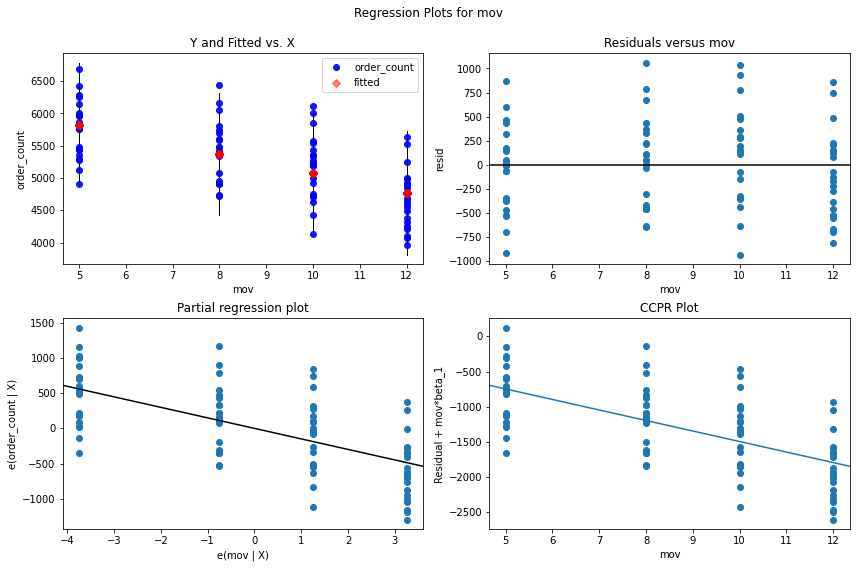

In [ ]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'mov', fig=fig)

## Zone level

In [ ]:
elas_zone = df1[["platform_order_code_ga","rev","mov","zone_name"]].copy()
elas_zone = elas_zone.drop_duplicates()
elas_zone = df.pivot_table(values = ["platform_order_code_ga","rev"], index=["mov","zone_name"], aggfunc = {"platform_order_code_ga": lambda x: len(x.unique()),"rev":"sum"}).reset_index()
elas_zone.rename(columns = {"platform_order_code_ga":"order_count"},inplace=True)
#elas_zone["demand_elas_zoneticity"] = elas_zone.order_count.pct_change() / elas_zone.mov.pct_change()
#elas_zone["rev_elas_zoneticity"] = elas_zone.rev.pct_change() / elas_zone.mov.pct_change()
elas_zone["rev"] = elas_zone["rev"].round(0)
index = elas_zone.copy()
index["mov"] = index["mov"].astype(str) 
index = index.pivot_table(["order_count","rev"], index=["zone_name"],columns = "mov",aggfunc ="sum").reset_index()
index.columns = ['_'.join(col).strip() for col in index.columns.values]
index.rename(columns={"zone_name_":"zone"},inplace=True)
index.columns
index = index[['zone', 'order_count_5', 'order_count_8', 'order_count_10', 'order_count_12', 'rev_5', 'rev_8', 'rev_10', 'rev_12']]
index
index.to_csv('index.csv')

In [ ]:
elas_zone_cd = df2[["platform_order_code_ga","rev","mov","cd_zone_name"]].copy()
elas_zone_cd = elas_zone_cd.drop_duplicates()
elas_zone_cd = df.pivot_table(values = ["platform_order_code_ga","rev"], index=["mov","cd_zone_name"], aggfunc = {"platform_order_code_ga": lambda x: len(x.unique()),"rev":"sum"}).reset_index()
elas_zone_cd.rename(columns = {"platform_order_code_ga":"order_count"},inplace=True)
#elas_zone_cd["demand_elas_zone_cdticity"] = elas_zone_cd.order_count.pct_change() / elas_zone_cd.mov.pct_change()
#elas_zone_cd["rev_elas_zone_cdticity"] = elas_zone_cd.rev.pct_change() / elas_zone_cd.mov.pct_change()
elas_zone_cd["rev"] = elas_zone_cd["rev"].round(0)
elas_zone_cd.rename(columns={"cd_zone_name":"zone_name"},inplace=True)

index_cd = elas_zone_cd.copy()
index_cd["mov"] = index_cd["mov"].astype(str) 
index_cd = index_cd.pivot_table(["order_count","rev"], index=["zone_name"],columns = "mov",aggfunc ="sum").reset_index()
index_cd.columns = ['_'.join(col).strip() for col in index_cd.columns.values]
index_cd.rename(columns={"zone_name_":"zone"},inplace=True)
index_cd.columns
index_cd = index_cd[['zone', 'order_count_5', 'order_count_8', 'order_count_10', 'order_count_12', 'rev_5', 'rev_8', 'rev_10', 'rev_12']]
index_cd

,zone,order_count_5,order_count_8,order_count_10,order_count_12,rev_5,rev_8,rev_10,rev_12
0,Amk,7591,7151,6851,6153,54397.0,52477.0,52145.0,49045.0
1,Bedok,7830,7761,7171,6491,63197.0,62905.0,61209.0,56636.0
2,Bukit timah,11623,10904,11167,9504,90266.0,87399.0,90155.0,80030.0
3,Bukitpanjang,12036,11427,10368,9342,86787.0,85952.0,80445.0,75719.0
4,Downtown,15105,14538,14043,13156,119217.0,118132.0,116187.0,111804.0
5,Far_east,13467,12651,12145,11010,106888.0,102177.0,100000.0,94841.0
6,Geylang,10713,10153,9425,8989,85209.0,82635.0,79154.0,78163.0
7,Jurong east,10906,9960,9875,8618,83049.0,78960.0,79825.0,73580.0
8,Jurongwest,7079,6621,6349,5327,46791.0,44632.0,46023.0,39839.0
9,Novena,15989,15693,14372,13925,124353.0,123981.0,117304.0,117319.0


In [ ]:
fig = px.line(elas_zone, x='mov', y='order_count',  facet_col="zone_name", facet_col_wrap=4,text = "order_count",
              height=800, width=1000, 
             category_orders = {"zone_name":zone_names})
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None)
fig.update_yaxes(showticklabels=False)
fig.show()

In [ ]:
fig = px.line(elas_zone_cd, x='mov', y='rev',  facet_col="zone_name", facet_col_wrap=4,text = "rev",
              height=800, width=1000, 
             category_orders = {"zone_name":zone_names}
              )
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None)
fig.update_yaxes(showticklabels=False)
fig.show()

In [ ]:
elas_zone
pivot_elas = elas_zone.pivot_table("rev",index ="zone_name", columns = "mov", aggfunc = "mean").reset_index()

# User Behavior Analysis

In [ ]:
query = """
SELECT  
distinct customer.user_id,
customer.variant,
variant variant_order,
o.order_code_google
FROM fulfillment-dwh-production.cl.dynamic_pricing_user_sessions u
left join fulfillment-dwh-production.cl._dps_sessions_mapped_to_orders m
on u.customer.session.id = m.dps_sessionid
and m.entity_id = "FP_SG"
left join `dhh---analytics-apac.pandata.fct_orders` o 
on m.platform_order_code = o.order_code_google
and o.rdbms_id = 15
and created_Date_local<current_Date()
WHERE date(datetime(u.created_at,"Asia/Singapore")) >= "2020-10-21" 
and date(datetime(u.created_at,"Asia/Singapore")) <='2020-11-10'
and u.created_date > "2020-10-20"
and u.entity_id = "FP_SG"
and customer.variant in ("Control","Variation1","Variation2", 'Variation3')
    """

user_order = client.query(query).to_dataframe()

In [ ]:
user_order.head()

,user_id,variant,variant_order,order_code_google
0,1604508964730.613817130971658900.fgkggx118z,Variation3,None,None
1,1601271046107.485949893523199400.lh3o510qp3,Control,None,None
2,1599048781723.3808079526.omwfxhyzxu,Variation2,None,None
3,1583519216869.108742108781328015.rb2QG4Yqbv,Variation3,None,None
4,1593917302819.875830492429966981.CcKx6e4cQO,Variation2,None,None


In [ ]:
#user_pivot = user_order[user_order.variant_order.notnull()]
user_pivot = user_order.pivot_table("order_code_google", index=["user_id","variant"],aggfunc = "count").reset_index()


,user_id,variant,order_code_google
0,00emia59bp6nid8k8nrzn0wjj3wcovtu61r,Variation2,0
1,00oohoinfl4tfckz7vouomwkyptofvoqlu,Variation3,0
2,00uf4b0nmqxuuv50ugx77sjpw59cfm5ear,Variation3,1
3,01pwovix408oerev4dsxxgajrkkzr2trxd,Control,0
4,038fgsi2we66cn0lwstt90iwh3w4hmzq5tipf4i9isbgld...,Variation2,0
...,...,...,...
428658,zygbisaw1f3ajwgt01tsix7jrrsmn958,Control,0
428659,zyy1s2r1lapvgbk5xbinvj6k8awzwfrjp,Variation1,0
428660,zzpw5hl5pb8lba5lwkar4f9ayzw5mtv,Control,1
428661,zzspog33prgc2qx8xa6dsdahmzlskuah,Variation3,0


In [ ]:
user_count = user_pivot.pivot_table("user_id", index=["variant","order_code_google"],aggfunc = "count").reset_index()
user_count

,variant,order_code_google,user_id
0,Control,0,63093
1,Control,1,16968
2,Control,2,8889
3,Control,3,5214
4,Control,4,3440
...,...,...,...
215,Variation3,59,1
216,Variation3,60,1
217,Variation3,61,1
218,Variation3,62,1


In [ ]:
fig = px.bar(user_count, x="order_code_google", y="user_id", facet_col = "variant", 
              #facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
              #facet_col_spacing=0.04, # default is 0.03
              height=600, width=1200, category_orders = {
                                 "variant": ["Control", "Variation1", "Variation2", "Variation3"]},
              title="Aggregated user delta across testing period")
#fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_yaxes(showticklabels=True)



fig.show()